# ICESat-2 and GEDI Analysis: Grand Mesa
Originally written by David Shean - notebook named GM_analysis_20211122.ipynb 
November 22, 2021  

Adapted by Hannah Besso
February 2022
Use conda environment datum_reproj3

### To do:
* acqdate - make a string from start?
* SNOTEL vs. ICESat-2 timestamps, local vs. UTC

In [1]:
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx
from matplotlib_scalebar.scalebar import ScaleBar
from astropy.time import Time
from datetime import datetime
#from imview.lib import pltlib

In [2]:
import matplotlib.dates as mdates

In [3]:
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)

In [4]:
import rasterio as rio
from rasterio import features

In [5]:
import rioxarray

In [6]:
from rasterio.plot import show

In [7]:
import hvplot.pandas
#from holoviews.element.tiles import EsriImagery, StamenTerrain
from geoviews import opts, tile_sources as gvts

In [8]:
plt.rcParams['figure.facecolor']='w'
plt.rcParams['axes.facecolor']='w'
plt.rcParams['savefig.facecolor']='w'

In [9]:
%matplotlib inline

In [10]:
import scipy.stats

In [11]:
def nmad(df):
    return scipy.stats.median_abs_deviation(df, nan_policy='omit', scale='normal')

def p16(df):
    return np.nanpercentile(df, 16)

def p84(df):
    return np.nanpercentile(df, 84)

def spread(df):
    return p84(df) - p16(df)

In [12]:
#Add DOY and DOWY column
def add_dowy(df, col=None):
    print("Adding Day of Water Year (DOWY)")
    if col is None:
        df['doy'] = df.index.dayofyear
        df['decyear'] = Time(df.index).decimalyear
    else:
        df['doy'] = pd.to_datetime(df[col]).dt.dayofyear
        df['decyear'] = Time(pd.to_datetime(df[col])).decimalyear
    
    #df['dowy'] = (df['doy'].index - pd.DateOffset(months=9)).dayofyear
    # Sept 30 is doy 273
    df['dowy'] = df['doy'] - 273
    df.loc[df['dowy'] <= 0, 'dowy'] += 365

In [13]:
#map_tiles = EsriImagery()
#map_tiles = StamenTerrain()
map_tiles = gvts.StamenTerrain

In [14]:
kw = {'width':500, 'height':400, 'hover':False, 'data_aspect':1, 'alpha':1.0}
kw['colorbar'] = True
kw['cmap'] = 'inferno'
#kw['s'] = 1
#kw['aggregator'] = 'mean'
#kw['rasterize'] = False
#Using datashade drops colorbar
kw['datashade'] = True
#kw['dynamic'] = True
#kw['backend'] = 'matplotlib'

In [15]:
#bbox = [38.8, -108.4, 39.2, -107.7]

In [177]:
#crs = 'EPSG:3857'

# Load SlideRule
Ran Data_Access_SR-ATL06.ipynb on 3/30/2022 for the methow_outline.geojson polygon.

In [15]:
atl06sr_fn = 'methow_all_sr-atl06_03302022.geojson'
atl06sr_gdf_ll = gpd.read_file(atl06sr_fn)
atl06sr_gdf_ll.time = pd.DatetimeIndex(atl06sr_gdf_ll.time)
atl06sr_gdf_ll = atl06sr_gdf_ll.set_index(['time'])
atl06sr_gdf_ll.sort_index(inplace=True)
atl06sr_gdf_ll['acqdate'] = atl06sr_gdf_ll.index.date
atl06sr_col = 'h_mean'
atl06sr_title = 'ICESat-2 ATL06-SR 40m (ground)'
atl06sr_gdf_ll.shape

(136513, 17)

## Export a snow-off point file for use with pc_align

### First, compare snow-off identification techniques:
* David's method: use Snotel (there are no snotel sites within the study area, so this is extrapolating a bit)
* Cesar and Simon's method: use the number of photon returns per segment

In [17]:
# Did this to create a csv file to use with pc_align
atl06sr_gdf_ll['x'] = atl06sr_gdf_ll.geometry.x.values
atl06sr_gdf_ll['y'] = atl06sr_gdf_ll.geometry.y.values

In [78]:
add_dowy(atl06sr_gdf_ll)

Adding Day of Water Year (DOWY)


In [19]:
#atl06sr_gdf_ll.to_csv(r'ATL06-SR_Methow_20220201183616_004.csv', index=None)

In [79]:
atl06sr_gdf_ll.head(2)

,distance,dh_fit_dx,gt,spot,w_surface_window_final,h_mean,dh_fit_dy,n_fit_photons,pflags,cycle,...,rms_misfit,delta_time,segment_id,geometry,acqdate,x,y,doy,decyear,dowy
time,,,,,,,,,,,,,,,,,,,,,
2018-11-09 22:09:43.662998,5.382001e+06,0.367318,20,1,9.386548,774.110259,0.0,41,0,1,...,0.506044,2.703658e+07,268398,POINT (-120.00053 48.33917),2018-11-09,-120.000526,48.339165,313,2018.857324,40
2018-11-09 22:09:43.789001,5.382903e+06,0.028568,20,1,3.000000,919.941824,0.0,42,0,1,...,0.305572,2.703658e+07,268443,POINT (-120.00167 48.34723),2018-11-09,-120.001665,48.347225,313,2018.857324,40


<AxesSubplot:>

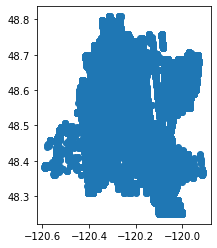

In [17]:
fig, ax = plt.subplots()
atl06sr_gdf_ll.plot(ax=ax)
#gm.iloc[0:1].plot(ax=ax, alpha=0.5)

In [42]:
atl06sr_gdf_ll.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [44]:
# Project to UTM Zone 10 N

#atl06sr_gdf = atl06sr_gdf_ll.to_crs('EPSG:32610')

In [80]:
atl06sr_gdf = atl06sr_gdf_ll

In [81]:
atl06sr_gdf.head(2)

,distance,dh_fit_dx,gt,spot,w_surface_window_final,h_mean,dh_fit_dy,n_fit_photons,pflags,cycle,...,rms_misfit,delta_time,segment_id,geometry,acqdate,x,y,doy,decyear,dowy
time,,,,,,,,,,,,,,,,,,,,,
2018-11-09 22:09:43.662998,5.382001e+06,0.367318,20,1,9.386548,774.110259,0.0,41,0,1,...,0.506044,2.703658e+07,268398,POINT (-120.00053 48.33917),2018-11-09,-120.000526,48.339165,313,2018.857324,40
2018-11-09 22:09:43.789001,5.382903e+06,0.028568,20,1,3.000000,919.941824,0.0,42,0,1,...,0.305572,2.703658e+07,268443,POINT (-120.00167 48.34723),2018-11-09,-120.001665,48.347225,313,2018.857324,40


## Load WaDNR data
* Note: none of these are tiled or compressed!

In [22]:
tif_fn = 'methow_basin_2018_dtm_combined2.tif'

In [ ]:
# #Since these tiles are mixed projection, can download, reproject and mosaic in one go
# !gdalwarp -r cubic -tr 12.0 12.0 -dstnodata -9999 -s_srs input.wkt -t_srs $dst_crs \
# -co COMPRESS=LZW -co TILED=YES -co BIGTIFF=IF_SAFER \
# $dnr_fn_list $tif_fn

In [51]:
dnr_fn = '../datasetsA/methow_basin_2018/dtm/raw/methow_basin_2018_dtm_combined_asp_12m.tif'
#dnr_gdalwarp_fn = 

In [50]:
!pwd

/Users/Hannah/Documents/Documents_Grad/Research/IDS_statewide/SlideRule_methow


## Load a polygon of the study area

In [67]:
dnr_gdf = gpd.read_file('methow_outline.geojson')

In [68]:
dnr_gdf = dnr_gdf.drop([0,1,2])

In [69]:
dnr_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

<AxesSubplot:>

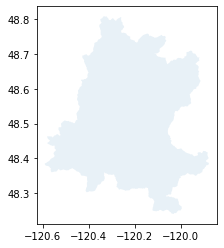

In [22]:
dnr_gdf.plot(alpha=0.1)

In [70]:
# This is UTM Zone 10N
dnr_snowoff_extent = dnr_gdf.to_crs('EPSG:32610').total_bounds
dnr_snowoff_extent

array([ 678410.08018125, 5347236.59329467,  731239.08413885,
       5409664.78384497])

In [71]:
dnr_gdf.total_bounds

array([-120.59027419,   48.2399849 , -119.87668762,   48.80903198])

<AxesSubplot:>

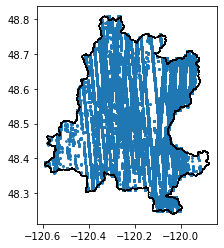

In [173]:
fig, ax = plt.subplots()

atl06sr_gdf.plot(ax=ax, markersize=3)
dnr_gdf.plot(ax=ax, facecolor='none', edgecolor='k')

## Find the approximate center of the Methow lidar data and make a 60km radius around it, for identifying nearby snotel

In [72]:
from shapely.geometry import Point

In [73]:
# Find the center

x1, y1 = dnr_snowoff_extent[0], dnr_snowoff_extent[1]
x2, y2 = dnr_snowoff_extent[2], dnr_snowoff_extent[3]

x_center = (x1 + x2) / 2
y_center = (y1 + y2) / 2

center = Point((x_center,y_center))
print(center)

POINT (704824.5821600494 5378450.688569823)


In [74]:
df_center= pd.DataFrame({'Location':['center']})
gdf_center = gpd.GeoDataFrame(df_center, geometry=[center])
gdf_center['geometry'] = gdf_center.geometry.buffer(60000)
gdf_center

,Location,geometry
0,center,"POLYGON ((764824.582 5378450.689, 764535.666 5..."


# Temporal filters
Can do range within single year or multiple dates

In [77]:
from datetime import date

dt_min = '2018-10-03' #First light ICESat-2
dt_max = date.today()   #'2022-02-01'

In [82]:
print(atl06sr_gdf.shape)

(136513, 22)


In [83]:
atl06sr = atl06sr_gdf
print(atl06sr.shape)

(136513, 22)


In [84]:
#c = 'decyear'
#c = 'acqdate'
#c = 'doy'
c = 'dowy'
#clim = (min(atl08[c].min(), gedi[c].min(), dg[c].min()), max(atl08[c].max(), gedi[c].max(), dg[c].max()))
clim = (1,366)

f, ax = plt.subplots(figsize=(10,6))
shared_kw = {'cmap':'twilight', 'column':c, 'vmin':clim[0], 'vmax':clim[1], 'markersize':1, 'lw':0.5}
ax.ticklabel_format(useOffset=False, style='plain')
gedi.plot(ax=ax, label=gedi_title, legend=True, legend_kwds={"label":c}, zorder=5, **shared_kw) #edgecolor='g', 
atl08.plot(ax=ax, label=atl08_title, marker='^', zorder=6, **shared_kw) #edgecolor='b', 
#aso.plot(ax=ax, label='ASO', alpha=alpha, edgecolor='k', zorder=4, **shared_kw)
#ax.autoscale(enable=False)
alpha=0.1
#dg.plot(ax=ax, label='DG stereo', alpha=alpha, edgecolor='k', zorder=3, **shared_kw)
#phr.plot(ax=ax, label='PHR stereo', alpha=alpha, edgecolor='k', zorder=2, **shared_kw)
#ssc.plot(ax=ax, label='SkySat-C stereo', alpha=alpha, edgecolor='k', zorder=1, **shared_kw)
#cx.add_basemap(ax, crs=gedi_gdf_poly.crs.to_string(), source=cx.providers.Stamen.Terrain)
#cx.add_basemap(ax, attribution=False, crs=gedi_gdf.crs.to_string(), source=basemap)
show(dg_src, ax=ax, **kw)
ax.add_artist(ScaleBar(1))
ax.set_xlim(*xlim)
ax.set_ylim(*ylim)
l = ax.legend(loc='lower right')
l.set_zorder(99)
ax.set_title('{} to {}'.format(dt_min, dt_max))
pltlib.hide_ticks(ax)
#plt.tight_layout()

## Get SNOTEL for same date range and add to time series

In [134]:
#Install directly from github repo main branch
#%pip install -q git+https://github.com/ulmo-dev/ulmo.git
#!conda install -y ulmo

In [85]:
#Despite warning, shouldn't need to restart kernel if all goes well with pip install
import ulmo

In [86]:
#This is the latest CUAHSI API endpoint
#http://his.cuahsi.org/wofws.html
wsdlurl = 'https://hydroportal.cuahsi.org/Snotel/cuahsi_1_1.asmx?WSDL'
sites = ulmo.cuahsi.wof.get_sites(wsdlurl)

In [87]:
sites_df = pd.DataFrame.from_dict(sites, orient='index').dropna()
sites_df['geometry'] = [Point(float(loc['longitude']), float(loc['latitude'])) for loc in sites_df['location']]

sites_df = sites_df.drop(columns='location')
sites_df = sites_df.astype({"elevation_m":float})

sites_gdf = gpd.GeoDataFrame(sites_df, crs='EPSG:4326', geometry=sites_df['geometry'])

In [88]:
# Create a transform that will go from the native ICESat-2 and Snotel CS (4326) to the common projection we will use (32610, ie UTM Zone 10 N)

target_crs = "EPSG:32610"
from pyproj import Transformer,CRS
to_target_crs = Transformer.from_crs(4326,target_crs)

In [89]:
# Transform the snotel site locations to 32610

points_snotel = []
points = list(zip(sites_gdf.geometry.y, sites_gdf.geometry.x, sites_gdf.elevation_m))
for pt in to_target_crs.itransform(points):
    points_snotel.append(pt)
x_snotel = [x_tuple[0] for x_tuple in points_snotel]
y_snotel = [y_tuple[1] for y_tuple in points_snotel]
z_snotel = [z_tuple[2] for z_tuple in points_snotel]
sites_gdf_transformed = gpd.GeoDataFrame(sites_gdf, geometry=gpd.points_from_xy(x_snotel, y_snotel))     # crs='EPSG:32610' - took this out because of deprecation warning
sites_gdf_transformed['elevation_transformed'] = z_snotel

In [90]:
snotel_60km = gpd.clip(sites_gdf_transformed, gdf_center)

In [108]:
snotel_60km

,code,name,network,elevation_m,site_property,geometry,elevation_transformed
SNOTEL:515_WA_SNTL,515_WA_SNTL,Harts Pass,SNOTEL,1978.151978,"{'county': 'Okanogan', 'state': 'Washington', ...",POINT (672206.062 5399027.491),1978.151978
SNOTEL:262_WA_SNTL,262_WA_SNTL,Mirror Lake,SNOTEL,1706.880005,"{'county': 'Chelan', 'state': 'Washington', 's...",POINT (674785.221 5335643.219),1706.880005
SNOTEL:1259_WA_SNTL,1259_WA_SNTL,Muckamuck,SNOTEL,1362.456055,"{'county': 'Okanogan', 'state': 'Washington', ...",POINT (731093.784 5386094.282),1362.456055
SNOTEL:681_WA_SNTL,681_WA_SNTL,Park Creek Ridge,SNOTEL,1402.079956,"{'county': 'Chelan', 'state': 'Washington', 's...",POINT (654147.806 5367847.622),1402.079956
SNOTEL:711_WA_SNTL,711_WA_SNTL,Rainy Pass,SNOTEL,1490.472046,"{'county': 'Chelan', 'state': 'Washington', 's...",POINT (667193.867 5376424.178),1490.472046
SNOTEL:728_WA_SNTL,728_WA_SNTL,Salmon Meadows,SNOTEL,1359.407959,"{'county': 'Okanogan', 'state': 'Washington', ...",POINT (732831.735 5393950.294),1359.407959
SNOTEL:975_WA_SNTL,975_WA_SNTL,Swamp Creek,SNOTEL,1197.864014,"{'county': 'Skagit', 'state': 'Washington', 's...",POINT (663563.081 5382187.777),1197.864014
SNOTEL:817_WA_SNTL,817_WA_SNTL,Thunder Basin,SNOTEL,1316.735962,"{'county': 'Skagit', 'state': 'Washington', 's...",POINT (648435.062 5376887.468),1316.735962


In [91]:
#Daily SWE
#variablecode = 'SNOTEL:WTEQ_D'
#Daily snow depth
variablecode = 'SNOTEL:SNWD_D'

In [92]:
site_codes = []
for i in range(len(snotel_60km)):
    site_codes.append(snotel_60km.index[i])
    
#Use corresponding colors in line and location scatterplots
color_list = ['C%i' % i for i in range(len(site_codes))]

site_codes

['SNOTEL:515_WA_SNTL',
 'SNOTEL:262_WA_SNTL',
 'SNOTEL:1259_WA_SNTL',
 'SNOTEL:681_WA_SNTL',
 'SNOTEL:711_WA_SNTL',
 'SNOTEL:728_WA_SNTL',
 'SNOTEL:975_WA_SNTL',
 'SNOTEL:817_WA_SNTL']

In [113]:
sitecode_list = ['SNOTEL:515_WA_SNTL',
 'SNOTEL:1259_WA_SNTL',
 'SNOTEL:681_WA_SNTL',
 'SNOTEL:711_WA_SNTL',
 'SNOTEL:728_WA_SNTL',
 'SNOTEL:975_WA_SNTL']

In [231]:
#Get current datetime
from datetime import datetime
today = datetime.today().strftime('%Y-%m-%d')

def snotel_fetch(sitecode, variablecode='SNOTEL:SNWD_D', start_date=dt_min, end_date=dt_max):
    #print(sitecode, variablecode, start_date, end_date)
    values_df = None
    try:
        #Request data from the server
        site_values = ulmo.cuahsi.wof.get_values(wsdlurl, sitecode, variablecode, start=start_date, end=end_date)
        #Convert to a Pandas DataFrame   
        values_df = pd.DataFrame.from_dict(site_values['values'])
        #Parse the datetime values to Pandas Timestamp objects
        values_df['datetime'] = pd.to_datetime(values_df['datetime'], utc=True) #pd.to_datetime(values_df['datetime'], utc=True) , freq='us'
        #Set the DataFrame index to the Timestamps
        values_df = values_df.set_index('datetime')
        #Convert values to float and replace -9999 nodata values with NaN
        values_df['value'] = pd.to_numeric(values_df['value']).replace(-9999, np.nan)
        #Remove any records flagged with lower quality
        values_df = values_df[values_df['quality_control_level_code'] == '1']
    except:
        print("Unable to fetch %s" % variablecode)

    return values_df

In [99]:
#site_values = ulmo.cuahsi.wof.get_values(wsdlurl, sitecode, variablecode)

In [203]:
# SNOTEL sites with a 60km radius of the Methow
pkl_fn = 'snotel_snwd_d.pkl'
gdf = snotel_60km

In [243]:
# SNOTEL sites with a 60km radius of the Methow
pkl_fn = 'snotel_snwd_d.pkl'
gdf = snotel_60km

if os.path.exists(pkl_fn):
    snwd_df = pd.read_pickle(pkl_fn)
else:
    #Define an empty dictionary to store returns for each site
    value_dict = {}
    for i, sitecode in enumerate(gdf.index):
        print('%i of %i sites' % (i+1, len(gdf.index)) )
        #out = fetch(sitecode, variablecode, start_date, end_date)
        out = snotel_fetch(sitecode, variablecode)
        if out is not None:
            value_dict[sitecode] = out['value']
    #Convert the dictionary to a DataFrame, automatically handles different datetime ranges (nice!)
    snwd_df = pd.DataFrame.from_dict(value_dict)
    #Write out
    print(f"Writing out: {pkl_fn}")
    snwd_df.to_pickle(pkl_fn)

1 of 8 sites
2 of 8 sites


Unable to fetch SNOTEL:SNWD_D
3 of 8 sites
4 of 8 sites
5 of 8 sites
6 of 8 sites
7 of 8 sites
8 of 8 sites
Writing out: snotel_snwd_d.pkl


In [244]:
snwd_df = snwd_df * 2.54/100
add_dowy(snwd_df)
snwd_df.head()

Adding Day of Water Year (DOWY)


,SNOTEL:515_WA_SNTL,SNOTEL:1259_WA_SNTL,SNOTEL:681_WA_SNTL,SNOTEL:711_WA_SNTL,SNOTEL:728_WA_SNTL,SNOTEL:975_WA_SNTL,SNOTEL:817_WA_SNTL,doy,decyear,dowy
datetime,,,,,,,,,,
2018-10-03 00:00:00+00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,276,2018.753425,3
2018-10-04 00:00:00+00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,277,2018.756164,4
2018-10-05 00:00:00+00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,278,2018.758904,5
2018-10-06 00:00:00+00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,279,2018.761644,6
2018-10-07 00:00:00+00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,280,2018.764384,7


In [109]:
# snotel_site_df = pd.DataFrame(snwd_df)
# snotel_site_gdf = gpd.GeoDataFrame(snotel_site_df, crs='EPSG:32610', \
#                                    geometry=gpd.points_from_xy(snotel_site_df['Longitude'], snotel_site_df['Latitude'])).to_crs(crs)

### Determine average snow-free dates

<AxesSubplot:xlabel='datetime'>

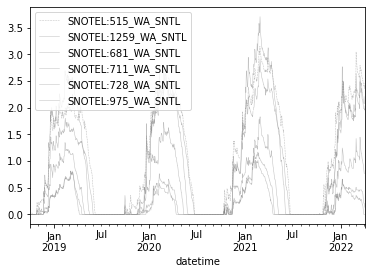

In [217]:
#Need index here to remove doy
snwd_df[sitecode_list].plot(alpha=0.5, color='gray', lw=0.5, style=['--','-'])

In [245]:
idx = (snwd_df[sitecode_list] < 0.1).all(axis=1)
idx

datetime
2018-10-03 00:00:00+00:00     True
2018-10-04 00:00:00+00:00     True
2018-10-05 00:00:00+00:00     True
2018-10-06 00:00:00+00:00     True
2018-10-07 00:00:00+00:00     True
                             ...  
2022-03-31 00:00:00+00:00    False
2022-04-01 00:00:00+00:00    False
2022-04-02 00:00:00+00:00    False
2022-04-03 00:00:00+00:00    False
2022-04-04 00:00:00+00:00    False
Freq: D, Length: 1280, dtype: bool

<AxesSubplot:>

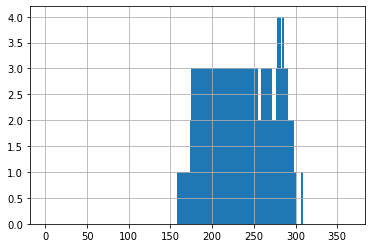

In [185]:
snwd_df[idx]['doy'].hist(bins=365, range=(0,365))

In [219]:
snowfree_doy_range = (160,310)

In [118]:
#snwd_df.drop(['doy','dowy','decyear'], axis=1, inplace=True)

### Try to Find Snow-Off Dates Based on Photon Counts
According to thresholds found by Simon and Cesar:
* Strong beams: > 186 photons = snow on 
* Weak beams: > 50 photons = snow on 

In [119]:
atl06sr_gdf.head(2)

,distance,dh_fit_dx,gt,spot,w_surface_window_final,h_mean,dh_fit_dy,n_fit_photons,pflags,cycle,...,rms_misfit,delta_time,segment_id,geometry,acqdate,x,y,doy,decyear,dowy
time,,,,,,,,,,,,,,,,,,,,,
2018-11-09 22:09:43.662998,5.382001e+06,0.367318,20,1,9.386548,774.110259,0.0,41,0,1,...,0.506044,2.703658e+07,268398,POINT (-120.00053 48.33917),2018-11-09,-120.000526,48.339165,313,2018.857324,40
2018-11-09 22:09:43.789001,5.382903e+06,0.028568,20,1,3.000000,919.941824,0.0,42,0,1,...,0.305572,2.703658e+07,268443,POINT (-120.00167 48.34723),2018-11-09,-120.001665,48.347225,313,2018.857324,40


In [124]:
strong = [1,3,5]
weak = [2,4,6]

atl06sr_strong = atl06sr_gdf.loc[atl06sr_gdf['spot'].isin(strong)]
atl06sr_weak = atl06sr_gdf.loc[atl06sr_gdf['spot'].isin(weak)]

In [127]:
atl06sr_strong_snowoff = atl06sr_strong.loc[atl06sr_strong['n_fit_photons'] > 186 ]
atl06sr_weak_snowoff = atl06sr_weak.loc[atl06sr_weak['n_fit_photons'] > 50]

In [129]:
snowoff_gdfs = [atl06sr_strong_snowoff, atl06sr_weak_snowoff]
atl06sr_pe_snowoff = pd.concat(snowoff_gdfs)

In [132]:
atl06sr_pe_snowoff.head(2)

,distance,dh_fit_dx,gt,spot,w_surface_window_final,h_mean,dh_fit_dy,n_fit_photons,pflags,cycle,...,rms_misfit,delta_time,segment_id,geometry,acqdate,x,y,doy,decyear,dowy
time,,,,,,,,,,,,,,,,,,,,,
2018-11-09 22:09:47.057999,5.406245e+06,-0.010414,40,3,3.0,1891.370605,0.0,284,0,1,...,0.402902,2.703659e+07,269608,POINT (-119.98895 48.55893),2018-11-09,-119.988946,48.558932,313,2018.857325,40
2018-11-09 22:09:47.061001,5.406265e+06,-0.095455,40,3,3.0,1890.031545,0.0,275,4,1,...,0.541101,2.703659e+07,269609,POINT (-119.98897 48.55911),2018-11-09,-119.988971,48.559105,313,2018.857325,40


Text(0.5, 1.0, 'Snotel < 0.1 cm')

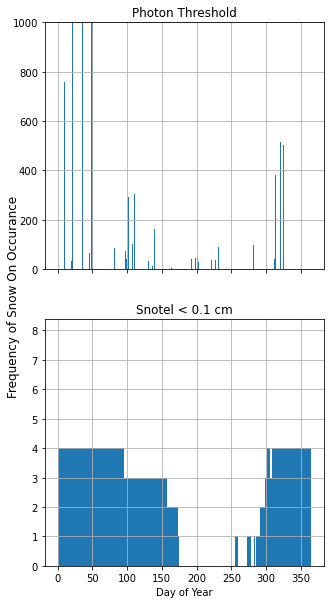

In [165]:
fig, ax = plt.subplots(2,1, figsize = (5, 10), sharex = True)
atl06sr_pe_snowoff['doy'].hist(bins=365, range=(0,365), ax=ax[0])
snwd_df[~idx]['doy'].hist(bins=365, range=(0,365), ax=ax[1])
ax[0].set_ylim(0,1000)
plt.xlabel('Day of Year')
fig.supylabel('Frequency of Snow On Occurance')
ax[0].set_title('Photon Threshold')
ax[1].set_title('Snotel < 0.1 cm')

<AxesSubplot:>

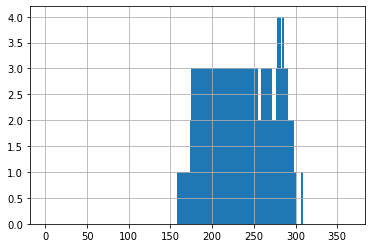

In [246]:
snwd_df[idx]['doy'].hist(bins=365, range=(0,365))

### Snotel seems more reliable, so proceed with snotel snow off days:

In [237]:
idx = (atl06sr_gdf['doy'] >= snowfree_doy_range[0]) & (atl06sr_gdf['doy'] <= snowfree_doy_range[1])

In [238]:
atl06sr_snowoff = atl06sr_gdf[idx]

In [240]:
atl06sr_snowoff.tail()

,distance,dh_fit_dx,gt,spot,w_surface_window_final,h_mean,dh_fit_dy,n_fit_photons,pflags,cycle,h_sigma,rgt,rms_misfit,delta_time,segment_id,geometry,acqdate,x,y,doy,decyear,dowy
time,,,,,,,,,,,,,,,,,,,,,,
2021-11-03 18:07:35.430000,5.421673e+06,0.096097,10,5,3.0,1987.216336,0.0,91,0,13,0.019627,646,0.177402,1.211981e+08,270378,POINT (-119.96786 48.69963),2021-11-03,-119.967861,48.699631,307,2021.840425,34
2021-11-03 18:07:35.432999,5.421693e+06,0.098339,10,5,3.0,1989.123627,0.0,98,0,13,0.018411,646,0.178477,1.211981e+08,270379,POINT (-119.96788 48.69981),2021-11-03,-119.967885,48.699810,307,2021.840425,34
2021-11-03 18:07:35.436001,5.421713e+06,0.087507,10,5,3.0,1990.938969,0.0,59,0,13,0.024705,646,0.158472,1.211981e+08,270380,POINT (-119.96791 48.69999),2021-11-03,-119.967909,48.699989,307,2021.840425,34
2021-11-03 18:07:35.516998,5.422294e+06,-0.048254,10,5,3.0,2069.374441,0.0,113,0,13,0.016050,646,0.164342,1.211981e+08,270409,POINT (-119.96865 48.70519),2021-11-03,-119.968649,48.705191,307,2021.840425,34
2021-11-03 18:07:35.520000,5.422314e+06,-0.062792,10,5,3.0,2068.280131,0.0,87,0,13,0.017732,646,0.143501,1.211981e+08,270410,POINT (-119.96867 48.70537),2021-11-03,-119.968673,48.705371,307,2021.840425,34


<AxesSubplot:>

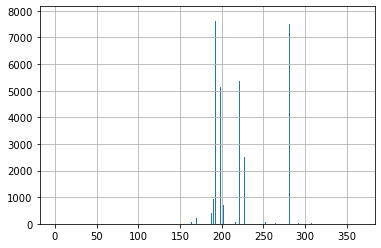

In [248]:
atl06sr_snowoff['doy'].hist(bins=365, range=(0,365))

In [247]:
atl06sr_snowoff.to_file('methow_snowoff_sr-atl0604042022.geojson', driver='GeoJSON')

# Difference with Reference DEM (ASO snow-off)

In [96]:
dem_fn = dnr_fn_list[0]

In [102]:
dnr_snowoff_src = rio.open(dnr_asp_fn)

In [169]:
#This is UTM 13N
#aso_snowoff_extent = rio.plot.plotting_extent(aso_snowoff_src)
#aso_snowoff_extent

In [103]:
dnr_snowoff_src.crs

CRS.from_epsg(26910)

In [99]:
src.nodata

-9999.0

In [172]:
#aso_snowoff = aso_snowoff_src.read(1, masked=True)

In [173]:
#f, ax = plt.subplots()
#ax.imshow(aso_snowoff)

In [105]:
def sample_raster(df, src, diff_col=None):
    #df_proj = df.to_crs(src.crs)
    coord = [(pt.x, pt.y) for pt in df.to_crs(src.crs).geometry]
    s = np.fromiter(src.sample(coord), dtype=src.dtypes[0])
    #s[s == src.nodata] = np.nan
    sm = np.ma.masked_equal(s, src.nodata)
    sample_colname = os.path.splitext(os.path.split(src.name)[-1])[0]
    df[sample_colname] = sm
    if diff_col is not None:
        out_colname = '{} {} diff'.format(diff_col, sample_colname)
        df[out_colname] = df[diff_col] - df[sample_colname]
    else:
        out_colname = sample_colname
    return out_colname

## Sample snow-off DEM

In [106]:
atl06sr_diff_col = sample_raster(atl06sr_crop, dnr_snowoff_src, diff_col=atl06sr_col)

/Users/Hannah/opt/miniconda3/envs/datum_reproj3/lib/python3.8/site-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


In [107]:
atl06sr_diff_col

'h_mean methow_basin_2018_dtm_combined_asp_12m diff'

In [425]:
atl06sr_crop

,distance,dh_fit_dx,n_fit_photons,spot,segment_id,rgt,h_sigma,w_surface_window_final,dh_fit_dy,rms_misfit,...,difference,diff_plus,aspect,bin,elevation_band,date,lidar_z,difference,methow_basin_2018_dtm_combined,h_mean methow_basin_2018_dtm_combined diff
utc,,,,,,,,,,,,,,,,,,,,,
2018-11-09,5.382622e+06,0.077249,18.0,1.0,268429.0,646.0,0.057151,3.000000,0.0,0.171520,...,-2.431104,-1.931104,NaN,NaN,2000,2018-11-09,863.955383,-2.431104,863.955383,-2.431104
2018-11-09,5.382642e+06,0.100535,24.0,1.0,268430.0,646.0,0.080678,3.000000,0.0,0.315877,...,-0.390651,0.109349,229.590454,"(220.0, 230.0]",2000,2018-11-09,863.838684,-0.390651,863.838684,-0.390651
2018-11-09,5.382903e+06,0.028427,41.0,1.0,268443.0,646.0,0.049227,3.000000,0.0,0.293801,...,-3.019799,-2.519799,257.232422,"(250.0, 260.0]",3000,2018-11-09,922.934387,-3.019799,922.934387,-3.019799
2018-11-09,5.382943e+06,-0.116346,31.0,1.0,268445.0,646.0,0.046864,3.029198,0.0,0.240594,...,-0.907093,-0.407093,296.122437,"(290.0, 300.0]",3000,2018-11-09,919.356506,-0.907093,919.356506,-0.907093
2018-11-09,5.382963e+06,-0.091051,39.0,1.0,268446.0,646.0,0.059177,3.000000,0.0,0.325895,...,-1.186654,-0.686654,287.165161,"(280.0, 290.0]",3000,2018-11-09,917.574036,-1.186654,917.574036,-1.186654
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-07-06,5.411978e+06,-0.043256,79.0,5.0,269894.0,204.0,0.024897,3.000000,0.0,0.221243,...,-0.238357,0.261643,297.758545,"(290.0, 300.0]",4000,2021-07-06,1329.332275,-0.238357,1329.332275,-0.238357
2021-07-06,5.411998e+06,-0.025424,60.0,5.0,269895.0,204.0,0.038652,3.000000,0.0,0.224820,...,-0.562809,-0.062809,99.547745,"(90.0, 100.0]",4000,2021-07-06,1328.972534,-0.562809,1328.972534,-0.562809
2021-07-06,5.412900e+06,0.006227,61.0,3.0,269940.0,204.0,0.104991,3.000000,0.0,0.367409,...,-0.444087,0.055913,70.524567,"(70.0, 80.0]",3000,2021-07-06,1107.301270,-0.444087,1107.301270,-0.444087


In [124]:
atl06sr_crop = atl06sr_crop.rename(columns={'methow_basin_2018_dtm_combined_asp_12m':'lidar_z','h_mean methow_basin_2018_dtm_combined_asp_12m diff':'difference'})

In [125]:
atl06sr_crop.columns

Index(['distance', 'dh_fit_dx', 'n_fit_photons', 'spot', 'segment_id', 'rgt',
       'h_sigma', 'w_surface_window_final', 'dh_fit_dy', 'rms_misfit',
       'delta_time', 'gt', 'pflags', 'cycle', 'h_mean', 'geometry', 'acqdate',
       'x', 'y', 'doy', 'decyear', 'dowy', 'lidar_z', 'difference'],
      dtype='object')

# Load in Snow Depth Data from Community Snow Observations  
https://app.communitysnowobs.org/

In [109]:
cso = gpd.read_file('cso-data.geojson')

In [110]:
cso.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

<AxesSubplot:>

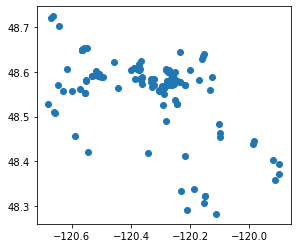

In [382]:
cso.plot()

In [111]:
cso = cso.to_crs('epsg:32610')

In [387]:
cso.head()

,id,author,depth,source,timestamp,elevation,_ms,geometry
0,va0zhRE1,Bob Sutherland,34.999999,MountainHub,2020-01-22T21:26:35.334999+00:00,1241.020142,1579728395335,POINT (729538.759 5364683.919)
1,uasqsrAK,Bob Sutherland,74.999997,MountainHub,2021-02-17T19:56:22.816999+00:00,1027.264893,1613591782817,POINT (722635.255 5369454.743)
2,V9/l9iNg,Carmen Vanbianchi,35.560000,MountainHub,2020-02-19T19:38:38.466000+00:00,1281.596191,1582141118466,POINT (711513.278 5382422.710)
3,PUZnqkOp,Bob Sutherland,33.020000,MountainHub,2019-01-07T20:53:12.443000+00:00,839.739136,1546894392443,POINT (714425.271 5370892.693)
4,BR+RpKNc,Bob Sutherland,62.999998,MountainHub,2021-03-10T20:08:53.981998+00:00,847.298218,1615406933982,POINT (711886.207 5385614.469)


In [112]:
cso['depth_m'] = cso['depth']/100

In [113]:
type(cso['timestamp'])

pandas.core.series.Series

In [114]:
cso['time'] = pd.to_datetime(cso['timestamp'])

In [115]:
cso = cso.set_index('time')

In [397]:
cso.head()

,id,author,depth,source,timestamp,elevation,_ms,geometry,depth_m
time,,,,,,,,,
2020-01-22 21:26:35.334999+00:00,va0zhRE1,Bob Sutherland,34.999999,MountainHub,2020-01-22T21:26:35.334999+00:00,1241.020142,1579728395335,POINT (729538.759 5364683.919),0.3500
2021-02-17 19:56:22.816999+00:00,uasqsrAK,Bob Sutherland,74.999997,MountainHub,2021-02-17T19:56:22.816999+00:00,1027.264893,1613591782817,POINT (722635.255 5369454.743),0.7500
2020-02-19 19:38:38.466000+00:00,V9/l9iNg,Carmen Vanbianchi,35.560000,MountainHub,2020-02-19T19:38:38.466000+00:00,1281.596191,1582141118466,POINT (711513.278 5382422.710),0.3556
2019-01-07 20:53:12.443000+00:00,PUZnqkOp,Bob Sutherland,33.020000,MountainHub,2019-01-07T20:53:12.443000+00:00,839.739136,1546894392443,POINT (714425.271 5370892.693),0.3302
2021-03-10 20:08:53.981998+00:00,BR+RpKNc,Bob Sutherland,62.999998,MountainHub,2021-03-10T20:08:53.981998+00:00,847.298218,1615406933982,POINT (711886.207 5385614.469),0.6300


## Make boxplots: Cut from 'Old' section

In [116]:
import matplotlib.dates as mdates
import matplotlib.cbook as cbook

In [117]:
mpl_epoch = '1970-01-01'

In [118]:
dt_min_plot = '2018-09-01'
dt_max_plot = '2022-02-01'

In [113]:
snwd_df.head()

,SNOTEL:515_WA_SNTL,SNOTEL:1259_WA_SNTL,SNOTEL:681_WA_SNTL,SNOTEL:699_WA_SNTL,SNOTEL:711_WA_SNTL,SNOTEL:728_WA_SNTL,SNOTEL:975_WA_SNTL,doy,decyear,dowy
datetime,,,,,,,,,,
2018-10-01 00:00:00+00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,274,2018.747945,1
2018-10-02 00:00:00+00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,275,2018.750685,2
2018-10-03 00:00:00+00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,276,2018.753425,3
2018-10-04 00:00:00+00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,277,2018.756164,4
2018-10-05 00:00:00+00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,278,2018.758904,5


In [119]:
snwd_df= snwd_df.drop(columns=['doy', 'decyear', 'dowy'])

In [120]:
def boxplot_date(df, col, groupby_col='acqdate', clim=(-5, 5)):
    bp_stats = df[[col, groupby_col]].dropna().groupby(groupby_col).apply(cbook.boxplot_stats)
    bp_stats_list = [i[0] for i in bp_stats.values]
    bp_width = df[[col, groupby_col]].dropna().groupby(groupby_col).count().values.ravel()
    bp_width = 20*bp_width/bp_width.max()+5
    pos = (pd.to_datetime(bp_stats.index) - pd.to_datetime(mpl_epoch)).days.values
    
    f, ax = plt.subplots(figsize=(15,10))
    bxp_f = ax.bxp(bp_stats_list, positions=pos, showfliers=False, showcaps=False, whiskerprops={'lw':0.5, 'alpha':0.2}, widths=bp_width)
    
    snwd_df[site_codes].plot(ax=ax, lw=0.5, style=['--','-'])
    
    cso['depth_m'].plot(ax=ax, linestyle='none', marker='.', color='k', markersize=5)
    
    ax.axhline(0, color='k', lw=0.5)
    ax.set_ylabel('Elevation difference (m)')
    ax.set_ylim(*clim)
    ax.set_xlim([dt_min_plot, dt_max_plot])
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    
    years = mdates.YearLocator(month=10)
    ax.format_xdata = mdates.DateFormatter('%Y-%m-%d')
    years_fmt = mdates.DateFormatter('%Y-%m-%d')
    ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(years_fmt)
    months = mdates.MonthLocator()
    ax.xaxis.set_minor_locator(months)

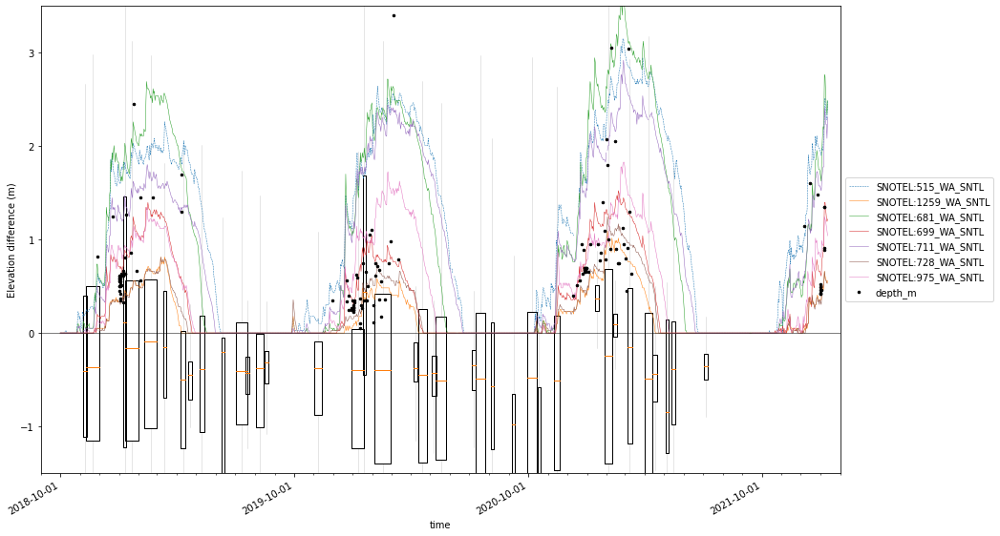

In [126]:
boxplot_date(atl06sr_crop, 'difference', clim=(-1.5, 3.5))

In [127]:
atl06sr_crop['difference'].describe()

count    91023.000000
mean        -0.514040
std          1.657225
min        -51.195079
25%         -1.181738
50%         -0.376829
75%          0.259560
max         14.580699
Name: difference, dtype: float64

In [421]:
atl06sr_crop.head(2)

,distance,dh_fit_dx,n_fit_photons,spot,segment_id,rgt,h_sigma,w_surface_window_final,dh_fit_dy,rms_misfit,...,dowy,lidar_z,difference,diff_plus,aspect,bin,elevation_band,date,lidar_z,difference
utc,,,,,,,,,,,,,,,,,,,,,
2018-11-09,5.382622e+06,0.077249,18.0,1.0,268429.0,646.0,0.057151,3.0,0.0,0.171520,...,40,863.955383,-2.431104,-1.931104,NaN,NaN,2000,2018-11-09,863.955383,-2.431104
2018-11-09,5.382642e+06,0.100535,24.0,1.0,268430.0,646.0,0.080678,3.0,0.0,0.315877,...,40,863.838684,-0.390651,0.109349,229.590454,"(220.0, 230.0]",2000,2018-11-09,863.838684,-0.390651


In [422]:
atl06sr_crop.drop(columns=['difference'])

,distance,dh_fit_dx,n_fit_photons,spot,segment_id,rgt,h_sigma,w_surface_window_final,dh_fit_dy,rms_misfit,...,doy,decyear,dowy,lidar_z,diff_plus,aspect,bin,elevation_band,date,lidar_z
utc,,,,,,,,,,,,,,,,,,,,,
2018-11-09,5.382622e+06,0.077249,18.0,1.0,268429.0,646.0,0.057151,3.000000,0.0,0.171520,...,313,2018.857324,40,863.955383,-1.931104,NaN,NaN,2000,2018-11-09,863.955383
2018-11-09,5.382642e+06,0.100535,24.0,1.0,268430.0,646.0,0.080678,3.000000,0.0,0.315877,...,313,2018.857324,40,863.838684,0.109349,229.590454,"(220.0, 230.0]",2000,2018-11-09,863.838684
2018-11-09,5.382903e+06,0.028427,41.0,1.0,268443.0,646.0,0.049227,3.000000,0.0,0.293801,...,313,2018.857324,40,922.934387,-2.519799,257.232422,"(250.0, 260.0]",3000,2018-11-09,922.934387
2018-11-09,5.382943e+06,-0.116346,31.0,1.0,268445.0,646.0,0.046864,3.029198,0.0,0.240594,...,313,2018.857324,40,919.356506,-0.407093,296.122437,"(290.0, 300.0]",3000,2018-11-09,919.356506
2018-11-09,5.382963e+06,-0.091051,39.0,1.0,268446.0,646.0,0.059177,3.000000,0.0,0.325895,...,313,2018.857324,40,917.574036,-0.686654,287.165161,"(280.0, 290.0]",3000,2018-11-09,917.574036
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-07-06,5.411978e+06,-0.043256,79.0,5.0,269894.0,204.0,0.024897,3.000000,0.0,0.221243,...,187,2021.512312,279,1329.332275,0.261643,297.758545,"(290.0, 300.0]",4000,2021-07-06,1329.332275
2021-07-06,5.411998e+06,-0.025424,60.0,5.0,269895.0,204.0,0.038652,3.000000,0.0,0.224820,...,187,2021.512312,279,1328.972534,-0.062809,99.547745,"(90.0, 100.0]",4000,2021-07-06,1328.972534
2021-07-06,5.412900e+06,0.006227,61.0,3.0,269940.0,204.0,0.104991,3.000000,0.0,0.367409,...,187,2021.512312,279,1107.301270,0.055913,70.524567,"(70.0, 80.0]",3000,2021-07-06,1107.301270


ValueError: List of boxplot statistics and `widths` values must have same the length

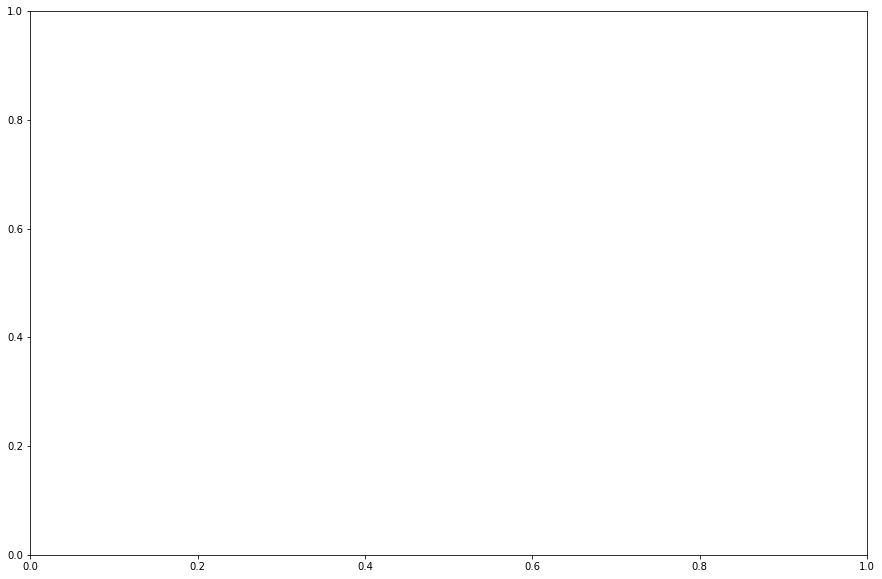

In [418]:
boxplot_date(atl06sr_crop, 'difference', clim=(-1.5, 3.5))

In [191]:
atl06sr_crop['difference'].describe()

count    80933.000000
mean        -0.553244
std          1.599694
min        -51.213634
25%         -1.186654
50%         -0.391290
75%          0.193409
max         16.461377
Name: h_mean methow_basin_2018_dtm_combined diff, dtype: float64

<AxesSubplot:>

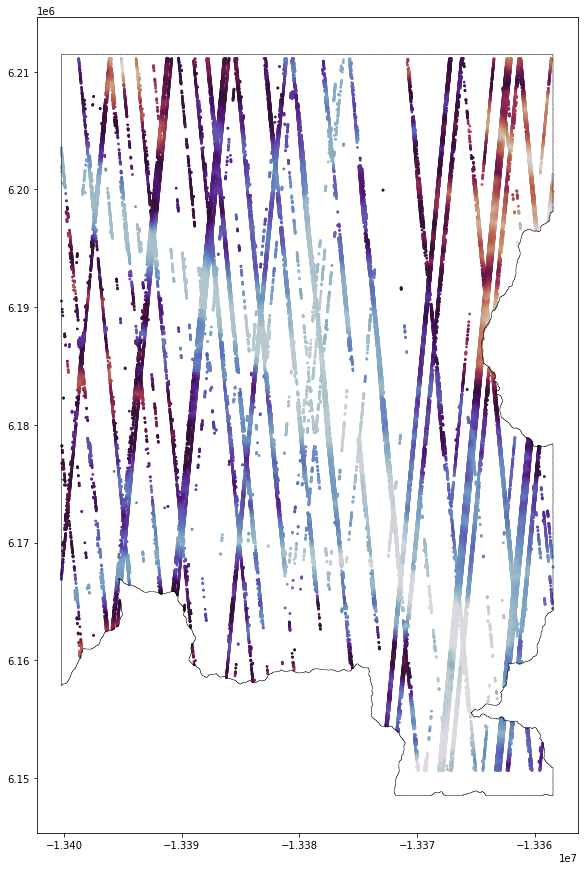

In [232]:
fig, ax = plt.subplots(figsize=(10,15))
atl06sr_crop.plot(ax=ax, column='h_mean', cmap='twilight', s=3)
dnr_gdf.iloc[0:1].plot(facecolor='None', edgecolor='k', lw=0.5, ax=ax)

In [199]:
len(atl06sr_crop.acqdate.unique())

34

In [151]:
atl06sr_crop['difference'].describe()

count    80933.000000
mean        -0.553244
std          1.599694
min        -51.213634
25%         -1.186654
50%         -0.391290
75%          0.193409
max         16.461377
Name: h_mean methow_basin_2018_dtm_combined diff, dtype: float64

In [155]:
atl06sr_crop['diff_plus'] = atl06sr_crop['difference'] + 0.5

/Users/Hannah/opt/miniconda3/envs/datum_reproj3/lib/python3.8/site-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


In [209]:
atl06sr_crop.head()

,distance,dh_fit_dx,n_fit_photons,spot,segment_id,rgt,h_sigma,w_surface_window_final,dh_fit_dy,rms_misfit,...,acqdate,x,y,doy,decyear,dowy,methow_basin_2018_dtm_combined,difference,diff_plus,aspect
utc,,,,,,,,,,,,,,,,,,,,,
2018-11-09 22:09:43,5.382622e+06,0.077249,18.0,1.0,268429.0,646.0,0.057151,3.000000,0.0,0.171520,...,2018-11-09,-1.335849e+07,-1.335849e+07,313,2018.857324,40,863.955383,-2.431104,-1.931104,NaN
2018-11-09 22:09:43,5.382642e+06,0.100535,24.0,1.0,268430.0,646.0,0.080678,3.000000,0.0,0.315877,...,2018-11-09,-1.335849e+07,-1.335849e+07,313,2018.857324,40,863.838684,-0.390651,0.109349,229.590454
2018-11-09 22:09:43,5.382903e+06,0.028427,41.0,1.0,268443.0,646.0,0.049227,3.000000,0.0,0.293801,...,2018-11-09,-1.335852e+07,-1.335852e+07,313,2018.857324,40,922.934387,-3.019799,-2.519799,257.232422
2018-11-09 22:09:43,5.382943e+06,-0.116346,31.0,1.0,268445.0,646.0,0.046864,3.029198,0.0,0.240594,...,2018-11-09,-1.335853e+07,-1.335853e+07,313,2018.857324,40,919.356506,-0.907093,-0.407093,296.122437
2018-11-09 22:09:43,5.382963e+06,-0.091051,39.0,1.0,268446.0,646.0,0.059177,3.000000,0.0,0.325895,...,2018-11-09,-1.335853e+07,-1.335853e+07,313,2018.857324,40,917.574036,-1.186654,-0.686654,287.165161


In [411]:
atl06sr_crop.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World between 85.06°S and 85.06°N.
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

# Slope and Aspect Metrics

Still need to figure out how to normalize a windrose plot so that it's easier to visualize differences in results there. The boxplot shows that the median across all aspects is very consistent (~ -0.5) which is consistent with the overall median difference. This tells me that most likely there is not an offset horizontally between the lidar and the ICESat-2 data.  
  
However, the -0.5 m offset vertically tells me that my vertical transformation is likely still off. This might be a result of using the wrong grid? Need to synthesize my vertical transformation methods and check with David about this.

In [201]:
src_asp = rio.open('methow_basin_2018/dtm/methow_basin_2018_dtm_combined_aspect.tif')

In [202]:
src_slo = rio.open('methow_basin_2018/dtm/methow_basin_2018_dtm_combined_slope.tif')

In [203]:
# From David Shean's GM_analysis_20211122 given to me by him in January 2022
def sample_raster(df, src, diff_col=None):
    #df_proj = df.to_crs(src.crs)
    coord = [(pt.x, pt.y) for pt in df.to_crs(src.crs).geometry]
    s = np.fromiter(src.sample(coord), dtype=src.dtypes[0])
    #s[s == src.nodata] = np.nan
    sm = np.ma.masked_equal(s, src.nodata)
    sample_colname = os.path.splitext(os.path.split(src.name)[-1])[0]
    df[sample_colname] = sm
    if diff_col is not None:
        out_colname = '{} {} diff'.format(diff_col, sample_colname)
        df[out_colname] = df[diff_col] - df[sample_colname]
    else:
        out_colname = sample_colname
    return out_colname

In [204]:
sample_raster(atl06sr_crop, src_asp)

'methow_basin_2018_dtm_combined_aspect'

In [84]:
sample_raster(atl06sr_crop, src_slo)

'methow_basin_2018_dtm_combined_slope'

In [205]:
atl06sr_crop = atl06sr_crop.rename(columns={'methow_basin_2018_dtm_combined_aspect':'aspect', 'methow_basin_2018_dtm_combined_slope':'slope'})

In [210]:
clim = np.percentile(atl06sr_crop['difference'].values,(5,95))
atl06sr_crop_95 = atl06sr_crop[atl06sr_crop['difference']<clim[1]]
atl06sr_crop_95_5 = atl06sr_crop_95[atl06sr_crop_95['difference']>clim[0]]

In [211]:
from windrose import WindroseAxes
import matplotlib.cm as cm

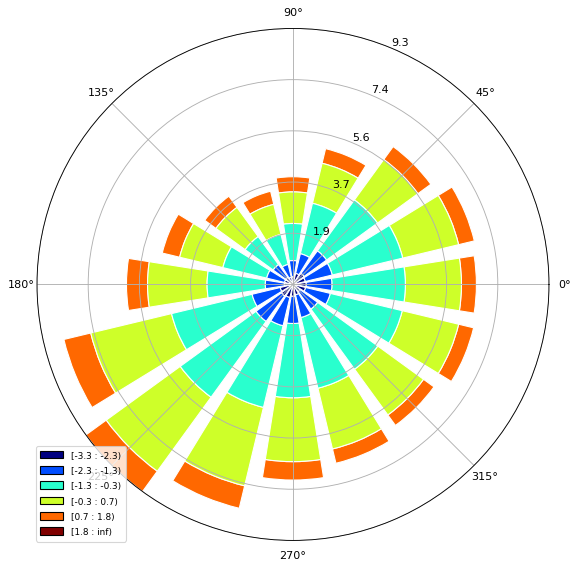

In [320]:
ax = WindroseAxes.from_ax()
ax.bar(atl06sr_crop_95_5.aspect, atl06sr_crop_95_5['difference'], normed=True, opening=0.8, edgecolor='white')
ax.set_legend();

In [321]:
bp_width = atl06sr_crop['difference'].dropna().groupby(atl06sr_crop['bin']).count().values.ravel()
bp_width = bp_width/bp_width.max()

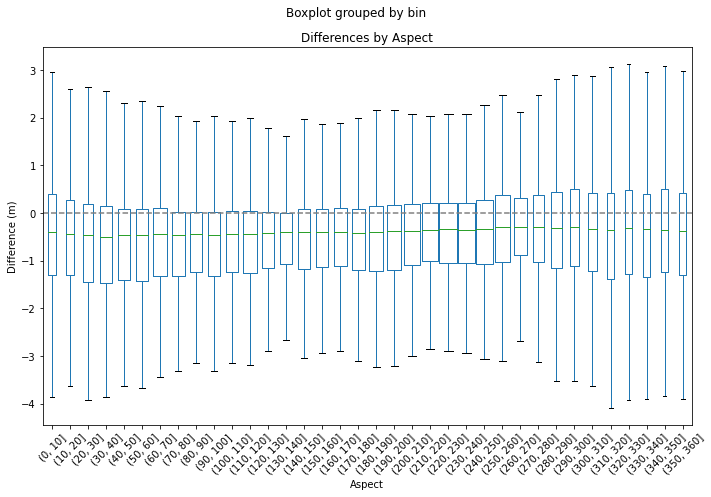

In [324]:
fig, ax = plt.subplots(figsize=(10,7))

atl06sr_crop.boxplot(column=['difference'], by=['bin'], widths=bp_width, grid=False, showfliers=False, ax=ax)
plt.axhline(y=0, color='grey', linestyle='--')
plt.xlabel('Aspect')
plt.xticks(rotation=45)
plt.ylabel('Difference (m)')
#plt.xticks(rotation=45)
plt.title('Differences by Aspect')
plt.tight_layout();

In [216]:
import plotly.express as px

In [239]:
fig = px.bar_polar(atl06sr_crop, r="difference", theta="aspect",color='difference')
#fig.show()

In [243]:
bins = np.arange(0,370,10)

In [244]:
bins

array([  0,  10,  20,  30,  40,  50,  60,  70,  80,  90, 100, 110, 120,
       130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250,
       260, 270, 280, 290, 300, 310, 320, 330, 340, 350, 360])

In [ ]:
atl06sr_crop['bin'] = atl06sr_crop['aspect'].apply(lambda x: )

In [247]:
atl06sr_crop['bin'] = pd.cut(atl06sr_crop['aspect'],bins)

In [307]:
atl06sr_crop.head()

,distance,dh_fit_dx,n_fit_photons,spot,segment_id,rgt,h_sigma,w_surface_window_final,dh_fit_dy,rms_misfit,...,x,y,doy,decyear,dowy,methow_basin_2018_dtm_combined,difference,diff_plus,aspect,bin
utc,,,,,,,,,,,,,,,,,,,,,
2018-11-09 22:09:43,5.382622e+06,0.077249,18.0,1.0,268429.0,646.0,0.057151,3.000000,0.0,0.171520,...,-1.335849e+07,-1.335849e+07,313,2018.857324,40,863.955383,-2.431104,-1.931104,NaN,NaN
2018-11-09 22:09:43,5.382642e+06,0.100535,24.0,1.0,268430.0,646.0,0.080678,3.000000,0.0,0.315877,...,-1.335849e+07,-1.335849e+07,313,2018.857324,40,863.838684,-0.390651,0.109349,229.590454,"(220.0, 230.0]"
2018-11-09 22:09:43,5.382903e+06,0.028427,41.0,1.0,268443.0,646.0,0.049227,3.000000,0.0,0.293801,...,-1.335852e+07,-1.335852e+07,313,2018.857324,40,922.934387,-3.019799,-2.519799,257.232422,"(250.0, 260.0]"
2018-11-09 22:09:43,5.382943e+06,-0.116346,31.0,1.0,268445.0,646.0,0.046864,3.029198,0.0,0.240594,...,-1.335853e+07,-1.335853e+07,313,2018.857324,40,919.356506,-0.907093,-0.407093,296.122437,"(290.0, 300.0]"
2018-11-09 22:09:43,5.382963e+06,-0.091051,39.0,1.0,268446.0,646.0,0.059177,3.000000,0.0,0.325895,...,-1.335853e+07,-1.335853e+07,313,2018.857324,40,917.574036,-1.186654,-0.686654,287.165161,"(280.0, 290.0]"


In [308]:
atl06sr_crop['bin'].dtype

CategoricalDtype(categories=[(0, 10], (10, 20], (20, 30], (30, 40], (40, 50] ... (310, 320], (320, 330], (330, 340], (340, 350], (350, 360]], ordered=True)

In [316]:
category_sum = []
bin_list = atl06sr_crop['bin'].unique()

for category in atl06sr_crop['bin'].unique():
    category_sum.append(np.sum(atl06sr_crop['bin'] == category))

In [317]:
bin_list

[NaN, (220.0, 230.0], (250.0, 260.0], (290.0, 300.0], (280.0, 290.0], ..., (30, 40], (60, 70], (40, 50], (70, 80], (90, 100]]
Length: 37
Categories (36, interval[int64, right]): [(0, 10] < (10, 20] < (20, 30] < (30, 40] ... (320, 330] < (330, 340] < (340, 350] < (350, 360]]

In [252]:
asp_hist = pd.DataFrame(bins)

In [264]:
asp_hist['freq'] = atl06sr_crop['bin'].value_counts()

In [313]:
counts = atl06sr_crop['bin'].value_counts()

In [314]:
counts

(220, 230]    3398
(230, 240]    3272
(240, 250]    3178
(200, 210]    3065
(210, 220]    3026
(250, 260]    2749
(190, 200]    2716
(180, 190]    2608
(110, 120]    2519
(60, 70]      2482
(160, 170]    2442
(170, 180]    2437
(70, 80]      2431
(80, 90]      2413
(50, 60]      2307
(260, 270]    2301
(100, 110]    2299
(150, 160]    2296
(90, 100]     2278
(130, 140]    2261
(40, 50]      2259
(120, 130]    2241
(140, 150]    2220
(30, 40]      2213
(270, 280]    1984
(20, 30]      1940
(280, 290]    1929
(290, 300]    1783
(10, 20]      1627
(300, 310]    1614
(310, 320]    1502
(0, 10]       1472
(350, 360]    1459
(320, 330]    1430
(340, 350]    1327
(330, 340]    1313
Name: bin, dtype: int64

In [305]:
count = counts.to_frame()

In [306]:
count['bin']

(220, 230]    0.042059
(230, 240]    0.040500
(240, 250]    0.039336
(200, 210]    0.037937
(210, 220]    0.037455
(250, 260]    0.034026
(190, 200]    0.033618
(180, 190]    0.032281
(110, 120]    0.031179
(60, 70]      0.030721
(160, 170]    0.030226
(170, 180]    0.030164
(70, 80]      0.030090
(80, 90]      0.029867
(50, 60]      0.028555
(260, 270]    0.028481
(100, 110]    0.028456
(150, 160]    0.028419
(90, 100]     0.028196
(130, 140]    0.027986
(40, 50]      0.027961
(120, 130]    0.027738
(140, 150]    0.027478
(30, 40]      0.027392
(270, 280]    0.024557
(20, 30]      0.024013
(280, 290]    0.023876
(290, 300]    0.022069
(10, 20]      0.020138
(300, 310]    0.019977
(310, 320]    0.018591
(0, 10]       0.018220
(350, 360]    0.018059
(320, 330]    0.017700
(340, 350]    0.016425
(330, 340]    0.016252
Name: bin, dtype: float64

In [277]:
count_order = count.sort_index()

In [300]:
count_order['bin'][0].dtype

dtype('int64')

In [285]:
asp_hist['freq'] = count_order['bin']

In [295]:
count_order['index'] = asp_hist[0]

In [302]:
type(count_order.index)

pandas.core.indexes.category.CategoricalIndex

In [222]:
def pol2cart(rho, phi, rotate):
    # given a point's polar coordinates rho (radial distance), phi (clockwise azimuth angle), 
    # and rotate (angle to add to phi to put 0 degrees at the top like a compass)
    #https://stackoverflow.com/questions/20924085/python-conversion-between-coordinates
    x = rho * np.cos(np.radians(-phi+rotate))
    y = rho * np.sin(np.radians(-phi+rotate))
    return(x, y)

In [224]:
aspect_x, aspect_y = pol2cart(atl06sr_crop_95_5['difference'], atl06sr_crop_95_5.aspect, 0)

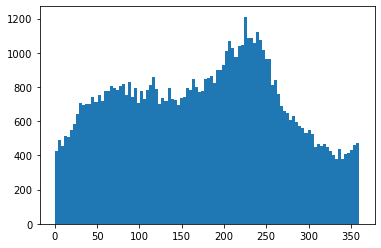

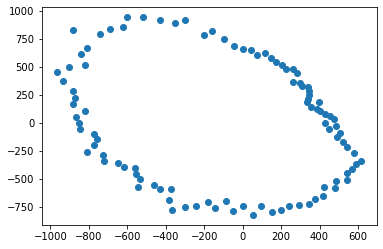

In [231]:
aspect_hist = plt.hist(atl06sr_crop_95_5.aspect.values.ravel(), bins=100)

aspect_x, aspect_y = pol2cart(aspect_hist[0],aspect_hist[1][:-1],0)

plt.figure()
plt.scatter(aspect_x, aspect_y, cmap=atl06sr_crop_95_5['difference'])

In [238]:
aspect_hist[0]

array([ 427.,  488.,  453.,  513.,  506.,  547.,  584.,  640.,  704.,
        697.,  702.,  701.,  744.,  710.,  754.,  716.,  779.,  778.,
        808.,  796.,  780.,  807.,  815.,  753.,  827.,  744.,  795.,
        707.,  775.,  730.,  785.,  811.,  861.,  791.,  698.,  736.,
        720.,  794.,  731.,  723.,  692.,  734.,  740.,  797.,  784.,
        849.,  800.,  773.,  779.,  846.,  851.,  867.,  826.,  897.,
        899.,  929., 1008., 1068., 1030.,  973., 1040., 1048., 1211.,
       1085., 1085., 1056., 1119., 1077., 1015.,  962.,  964.,  813.,
        840.,  759.,  690.,  662.,  650.,  608.,  632.,  595.,  569.,
        559.,  533.,  548.,  525.,  449.,  466.,  454.,  464.,  449.,
        426.,  400.,  381.,  437.,  381.,  409.,  414.,  434.,  460.,
        475.])

# Elevation Metrics

## Pull Snotel Data At Different Elevation Bands

#### Elevations in this region span 1345 to 6545 ft. I will separate these into elevation bands:  
* 1345-3000 ft = 914.4 m,  
* 3001 - 4000 = 1219.2 m,  
* 4001-5000 = 1524 m,  
* 5001-6000 = 1828.8 m,  
* 6000-7000 = 2133.6 m

In [325]:
snotel_60km['elevation_ft'] = snotel_60km['elevation_m'] * 3.28

In [326]:
elev_thresholds = [3000, 4000, 5000, 6000] #feet

snotel_60km_2k = snotel_60km[snotel_60km['elevation_ft'] < elev_thresholds[0]]
#print(snotel_60km_2k)

snotel_60km_3k = snotel_60km[(snotel_60km['elevation_ft'] < elev_thresholds[1]) & (snotel_60km['elevation_ft'] > elev_thresholds[0])]
#print(snotel_60km_3k)

snotel_60km_4k = snotel_60km[(snotel_60km['elevation_ft'] < elev_thresholds[2]) & (snotel_60km['elevation_ft'] > elev_thresholds[1])]
#print(snotel_60km_4k)

snotel_60km_5k = snotel_60km[(snotel_60km['elevation_ft'] < elev_thresholds[3]) & (snotel_60km['elevation_ft'] > elev_thresholds[2])]
#print(snotel_60km_5k)

snotel_60km_6k = snotel_60km[(snotel_60km['elevation_ft'] > elev_thresholds[3])]
#print(snotel_60km_6k)

In [327]:
# SNOTEL sites with a 60km radius of the Methow

pkl_fns = ['snotel_snwd_d_2k.pkl', 'snotel_snwd_d_3k.pkl', 'snotel_snwd_d_4k.pkl', 'snotel_snwd_d_5k.pkl', 'snotel_snwd_d_6k.pkl']
gdfs = [snotel_60km_2k, snotel_60km_3k, snotel_60km_4k, snotel_60km_5k, snotel_60km_6k]
dfs = {}

#for x in range(0, len(pkl_fns)):
for pkl_fn, gdf, x in zip(pkl_fns, gdfs, range(0,len(pkl_fns))):
    if os.path.exists(pkl_fn):
        dfs[x] = pd.read_pickle(pkl_fn)
    else:
        #Define an empty dictionary to store returns for each site
        value_dict = {}
        for i, sitecode in enumerate(gdf.index):
            print('%i of %i sites' % (i+1, len(gdf.index)) )
            #out = fetch(sitecode, variablecode, start_date, end_date)
            out = fetch(sitecode, variablecode)
            if out is not None:
                value_dict[sitecode] = out['value']
        #Convert the dictionary to a DataFrame, automatically handles different datetime ranges (nice!)
        dfs[x] = pd.DataFrame.from_dict(value_dict)
        dfs[x] = (dfs[x]*2.54)/100
        #Write out
        print(f"Writing out: {pkl_fn}")
        dfs[x].to_pickle(pkl_fn)

In [334]:
atl06sr_crop

,distance,dh_fit_dx,n_fit_photons,spot,segment_id,rgt,h_sigma,w_surface_window_final,dh_fit_dy,rms_misfit,...,x,y,doy,decyear,dowy,methow_basin_2018_dtm_combined,difference,diff_plus,aspect,bin
utc,,,,,,,,,,,,,,,,,,,,,
2018-11-09 22:09:43,5.382622e+06,0.077249,18.0,1.0,268429.0,646.0,0.057151,3.000000,0.0,0.171520,...,-1.335849e+07,-1.335849e+07,313,2018.857324,40,863.955383,-2.431104,-1.931104,NaN,NaN
2018-11-09 22:09:43,5.382642e+06,0.100535,24.0,1.0,268430.0,646.0,0.080678,3.000000,0.0,0.315877,...,-1.335849e+07,-1.335849e+07,313,2018.857324,40,863.838684,-0.390651,0.109349,229.590454,"(220.0, 230.0]"
2018-11-09 22:09:43,5.382903e+06,0.028427,41.0,1.0,268443.0,646.0,0.049227,3.000000,0.0,0.293801,...,-1.335852e+07,-1.335852e+07,313,2018.857324,40,922.934387,-3.019799,-2.519799,257.232422,"(250.0, 260.0]"
2018-11-09 22:09:43,5.382943e+06,-0.116346,31.0,1.0,268445.0,646.0,0.046864,3.029198,0.0,0.240594,...,-1.335853e+07,-1.335853e+07,313,2018.857324,40,919.356506,-0.907093,-0.407093,296.122437,"(290.0, 300.0]"
2018-11-09 22:09:43,5.382963e+06,-0.091051,39.0,1.0,268446.0,646.0,0.059177,3.000000,0.0,0.325895,...,-1.335853e+07,-1.335853e+07,313,2018.857324,40,917.574036,-1.186654,-0.686654,287.165161,"(280.0, 290.0]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-07-06 23:51:25,5.411978e+06,-0.043256,79.0,5.0,269894.0,204.0,0.024897,3.000000,0.0,0.221243,...,-1.338505e+07,-1.338505e+07,187,2021.512312,279,1329.332275,-0.238357,0.261643,297.758545,"(290.0, 300.0]"
2021-07-06 23:51:25,5.411998e+06,-0.025424,60.0,5.0,269895.0,204.0,0.038652,3.000000,0.0,0.224820,...,-1.338505e+07,-1.338505e+07,187,2021.512312,279,1328.972534,-0.562809,-0.062809,99.547745,"(90.0, 100.0]"
2021-07-06 23:51:25,5.412900e+06,0.006227,61.0,3.0,269940.0,204.0,0.104991,3.000000,0.0,0.367409,...,-1.339001e+07,-1.339001e+07,187,2021.512312,279,1107.301270,-0.444087,0.055913,70.524567,"(70.0, 80.0]"


In [337]:
#https://datagy.io/pandas-conditional-column/

conditions = [
    (atl06sr_crop['lidar_z'] < 914.4), # below 3k ft elevation (in this case, between 1345 and 3000 ft)
    (atl06sr_crop['lidar_z'] >= 914.4) & (atl06sr_crop['lidar_z'] < 1219.2), # between 3k and 4k ft elevation
    (atl06sr_crop['lidar_z'] >= 1219.2) & (atl06sr_crop['lidar_z'] < 1524), # between 4k and 5k ft. elevation
    (atl06sr_crop['lidar_z'] >= 1524) & (atl06sr_crop['lidar_z'] < 1828.8), # between 5k and 6k ft elevation
    (atl06sr_crop['lidar_z'] >= 1828.8) # above 6k ft elevation (highest point is below 7k)
]
values = [2000, 3000, 4000, 5000, 6000]
atl06sr_crop['elevation_band'] = np.select(conditions, values)

In [338]:
atl06sr_crop.index = atl06sr_crop.index.to_period('D')

In [341]:
atl06sr_crop['date'] = atl06sr_crop.index

In [342]:
bp_stats = atl06sr_crop.loc[atl06sr_crop['elevation_band'] == 3000][['difference', 'date']].dropna().groupby('date').apply(cbook.boxplot_stats)

In [343]:
loc = 'elevation_band'
loc_list = [3000, 4000, 6000]
df = atl06sr_crop
col='difference'
groupby_col='date'
bp_stats = df.loc[df[loc] == (loc_list[i] for i in loc_list)][[col, groupby_col]].dropna().groupby(groupby_col).apply(cbook.boxplot_stats)

In [344]:
def boxplot_date_elevation(df, loc, loc_list, col, groupby_col='date', clim=(-5, 5)):
    bp_stats = df.loc[df[loc] == 
    (loc_list[i] for i in loc_list)][[col, groupby_col]].dropna().groupby(groupby_col).apply(cbook.boxplot_stats)
    bp_stats_list = [i[0] for i in bp_stats.values]
    bp_width = df.loc[df[loc] == (loc_list[i] for i in loc_list)][[col, groupby_col]].dropna().groupby(groupby_col).count().values.ravel()
    bp_width = 20*bp_width/bp_width.max()+5
    pos = (pd.to_datetime(bp_stats.index) - pd.to_datetime(mpl_epoch)).days.values
    
    f, ax = plt.subplots(1,3, figsize=(10,5))
    bxp_f = ax[0].bxp(bp_stats_list, positions=pos, showfliers=False, showcaps=False, whiskerprops={'lw':0.5, 'alpha':0.2}, widths=bp_width)
    
    snwd_df_m.plot(ax=ax, lw=0.5, style=['--','-'])
    
    ax.axhline(0, color='k', lw=0.5)
    ax.set_ylabel('Elevation difference (m)')
    ax.set_ylim(*clim)
    #ax.set_xlim([dt_min_plot, dt_max_plot])
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    
    years = mdates.YearLocator(month=10)
    ax.format_xdata = mdates.DateFormatter('%Y-%m-%d')
    years_fmt = mdates.DateFormatter('%Y-%m-%d')
    ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(years_fmt)
    months = mdates.MonthLocator()
    ax.xaxis.set_minor_locator(months)

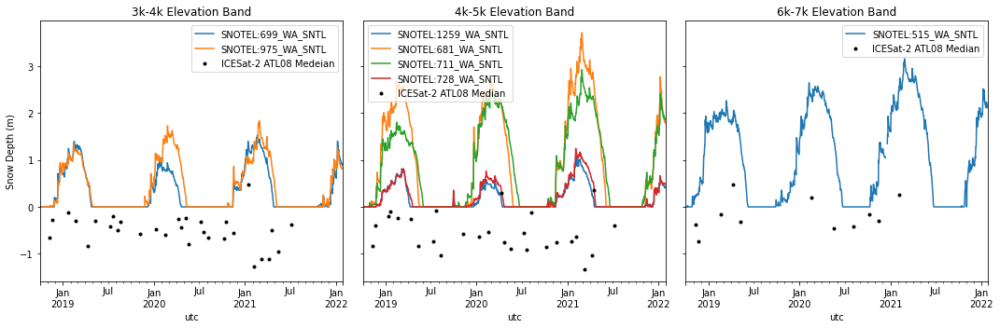

In [345]:
fig, ax = plt.subplots(1,3, figsize=(15, 5), sharey=True)

dfs[1].plot(ax=ax[0])
dfs[2].plot(ax=ax[1])
dfs[4].plot(ax=ax[2])

atl06sr_crop['difference'].loc[atl06sr_crop['elevation_band'] == 
    3000].groupby(atl06sr_crop.loc[atl06sr_crop['elevation_band'] == 
        3000].index).median().plot(ax=ax[0], 
            color='k', marker='.', linestyle='none', 
                label = 'ICESat-2 ATL08 Medeian') 

atl06sr_crop['difference'].loc[atl06sr_crop['elevation_band'] == 
    4000].groupby(atl06sr_crop.loc[atl06sr_crop['elevation_band'] == 
        4000].index).median().plot(ax=ax[1], 
            color='k', marker='.', linestyle='none',
                label = 'ICESat-2 ATL08 Median') 

atl06sr_crop['difference'].loc[atl06sr_crop['elevation_band'] == 
    6000].groupby(atl06sr_crop.loc[atl06sr_crop['elevation_band'] == 
        6000].index).median().plot(ax=ax[2], 
            color='k', marker='.', linestyle='none',
                label = 'ICESat-2 ATL08 Median') 

ax[0].set_ylabel('Snow Depth (m)')

ax[0].legend()
ax[1].legend()
ax[2].legend(loc='best')

ax[0].set_title('3k-4k Elevation Band')
ax[1].set_title('4k-5k Elevation Band')
ax[2].set_title('6k-7k Elevation Band')
plt.tight_layout();
#atl08_methow_95_5['difference_cm'][atl08_methow_95_5['elevation_band'] == 3000].groupby(atl08_methow_95_5.index).median().plot(ax=ax)

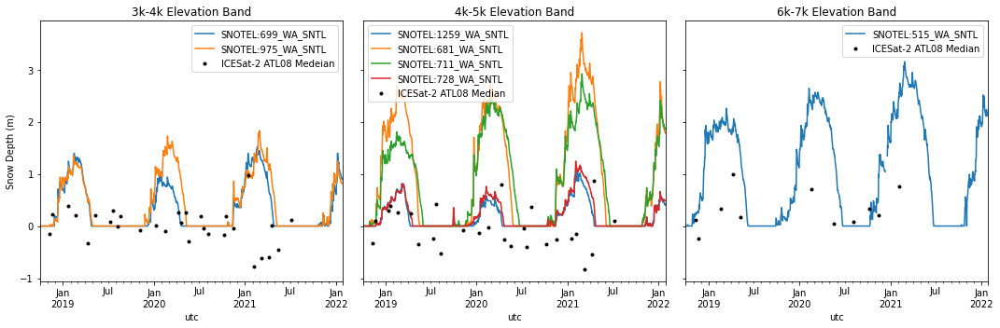

In [346]:
fig, ax = plt.subplots(1,3, figsize=(15, 5), sharey=True)

dfs[1].plot(ax=ax[0])
dfs[2].plot(ax=ax[1])
dfs[4].plot(ax=ax[2])

atl06sr_crop['diff_plus'].loc[atl06sr_crop['elevation_band'] == 
    3000].groupby(atl06sr_crop.loc[atl06sr_crop['elevation_band'] == 
        3000].index).median().plot(ax=ax[0], 
            color='k', marker='.', linestyle='none', 
                label = 'ICESat-2 ATL08 Medeian') 

atl06sr_crop['diff_plus'].loc[atl06sr_crop['elevation_band'] == 
    4000].groupby(atl06sr_crop.loc[atl06sr_crop['elevation_band'] == 
        4000].index).median().plot(ax=ax[1], 
            color='k', marker='.', linestyle='none',
                label = 'ICESat-2 ATL08 Median') 

atl06sr_crop['diff_plus'].loc[atl06sr_crop['elevation_band'] == 
    6000].groupby(atl06sr_crop.loc[atl06sr_crop['elevation_band'] == 
        6000].index).median().plot(ax=ax[2], 
            color='k', marker='.', linestyle='none',
                label = 'ICESat-2 ATL08 Median') 

ax[0].set_ylabel('Snow Depth (m)')

ax[0].legend()
ax[1].legend()
ax[2].legend(loc='best')

ax[0].set_title('3k-4k Elevation Band')
ax[1].set_title('4k-5k Elevation Band')
ax[2].set_title('6k-7k Elevation Band')
plt.tight_layout();

# Select only the snow-off dates

In [347]:
idx = (snwd_df < 0.1).all(axis=1)
idx

datetime
2018-10-01 00:00:00+00:00     True
2018-10-02 00:00:00+00:00     True
2018-10-03 00:00:00+00:00     True
2018-10-04 00:00:00+00:00     True
2018-10-05 00:00:00+00:00     True
                             ...  
2022-01-08 00:00:00+00:00    False
2022-01-09 00:00:00+00:00    False
2022-01-10 00:00:00+00:00    False
2022-01-11 00:00:00+00:00    False
2022-01-12 00:00:00+00:00    False
Length: 1200, dtype: bool

In [349]:
add_doy(snwd_df)

NameError: name 'add_doy' is not defined

In [348]:
snwd_df[idx]['doy'].hist(bins=365, range=(0,365))

KeyError: 'doy'

## Sample DEM metrics: Will keep, but don't need to run yet.
I'll save this for once I'm trying to figure out differences between sites.

In [102]:
dem_fn = aso_fn_list[aso_idx]

In [103]:
dem_fn

'ASO/ASO_3M_PCDTM_USCOGM_20160926_20160926.tif'

In [104]:
#for dem_fn in [aso_fn_list[aso_idx], os.path.splitext(aso_fn_list[aso_idx])+'_8x.tif']:
for dem_fn in [os.path.splitext(aso_fn_list[aso_idx])[0]+'_8x.tif']:
    for v in ['slope', 'tri', 'roughness']:
        #gdaldem_fn = os.path.splitext(aso_fn_list[aso_idx])[0]+f'_{v}.tif'
        gdaldem_fn = os.path.splitext(dem_fn)[0]+f'_{v}.tif'
        print(gdaldem_fn)
        !gdaldem {v} {dem_fn} {gdaldem_fn} -co COMPRESS=LZW -co TILED=YES 
        gdaldem_src = rio.open(gdaldem_fn)
        sample_raster(atl08_crop, gdaldem_src)
        sample_raster(gedi_crop, gdaldem_src)
        sample_raster(atl06sr_crop, gdaldem_src)

ASO/ASO_3M_PCDTM_USCOGM_20160926_20160926_8x_slope.tif
ERROR 4: ASO/ASO_3M_PCDTM_USCOGM_20160926_20160926_8x.tif: No such file or directory
GDALOpen failed - 4
ASO/ASO_3M_PCDTM_USCOGM_20160926_20160926_8x.tif: No such file or directory


RasterioIOError: ASO/ASO_3M_PCDTM_USCOGM_20160926_20160926_8x_slope.tif: No such file or directory

In [200]:
atl06sr_crop.columns

Index(['geometry', 'cycle', 'delta_time', 'dh_fit_dx', 'dh_fit_dy', 'distance',
       'gt', 'h_mean', 'h_sigma', 'n_fit_photons', 'pflags', 'rgt',
       'rms_misfit', 'segment_id', 'spot', 'w_surface_window_final', 'acqdate',
       'x', 'y', 'doy', 'decyear', 'dowy',
       'ASO_3M_PCDTM_USCOGM_20160926_20160926',
       'h_mean ASO_3M_PCDTM_USCOGM_20160926_20160926 diff',
       'ASO_3M_PCDTM_USCOGM_20160926_20160926_8x_slope',
       'ASO_3M_PCDTM_USCOGM_20160926_20160926_8x_tri',
       'ASO_3M_PCDTM_USCOGM_20160926_20160926_8x_roughness'],
      dtype='object')

In [194]:
gdaldem_fn = os.path.splitext(dem_fn)[0]+f'_slope.tif'
gdaldem_src = rio.open(gdaldem_fn)
gdaldem = gdaldem_src.read(1, masked=True)

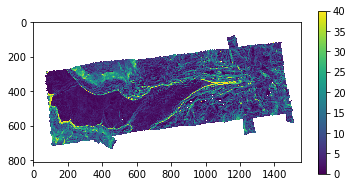

In [199]:
f, ax = plt.subplots(figsize=(6,3))
m = ax.imshow(gdaldem, vmin=0, vmax=40)
f.colorbar(m)

In [201]:
import rioxarray

In [202]:
ds = rioxarray.open_rasterio(gdaldem_fn, masked=True)

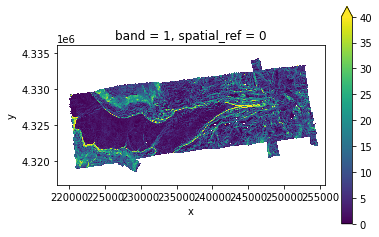

In [204]:
ax = ds.squeeze().plot.imshow(vmin=0, vmax=40)
ax.axes.set_aspect('equal')

In [205]:
atl08_slope_col = 'ASO_3M_PCDTM_USCOGM_20160926_20160926_8x_slope'

<AxesSubplot:>

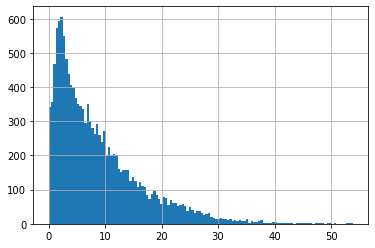

In [232]:
atl08_crop[atl08_slope_col].hist(bins=128)

<AxesSubplot:>

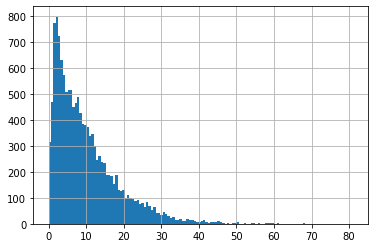

In [234]:
atl08_crop['ASO_3M_PCDTM_USCOGM_20160926_20160926_8x_tri'].hist(bins=128)

(0.0, 40.0)

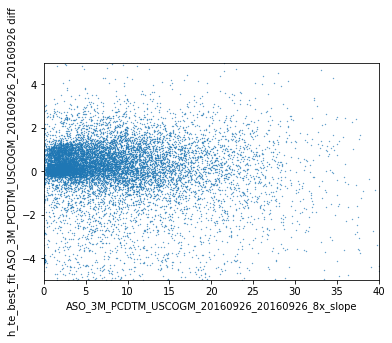

In [228]:
col1 = atl08_slope_col
col2 = atl08_diff_col
ax = atl08_crop.plot(kind='scatter', x=col1, y=col2, s=0.1)
ax.set_ylim(-5, 5)
ax.set_xlim(0, 40)

(0.0, 40.0)

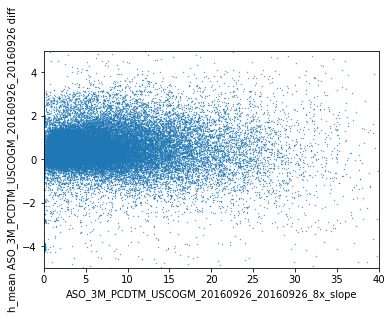

In [229]:
col1 = atl08_slope_col
col2 = atl06sr_diff_col
ax = atl06sr_crop.plot(kind='scatter', x=col1, y=col2, s=0.1)
ax.set_ylim(-5, 5)
ax.set_xlim(0, 40)

(0.0, 10.0)

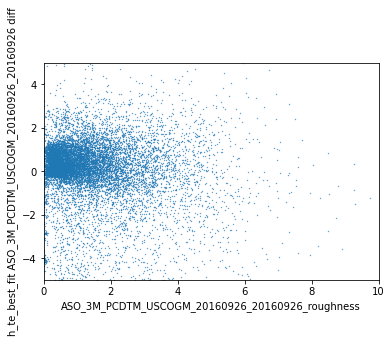

In [162]:
col1 = 'ASO_3M_PCDTM_USCOGM_20160926_20160926_roughness'
col2 = atl08_diff_col
ax = atl08_crop.plot(kind='scatter', x=col1, y=col2, s=0.1)
ax.set_ylim(-5, 5)
ax.set_xlim(0, 10)

In [163]:
atl08_crop.columns

Index(['segment_id_beg', 'segment_id_end', 'delta_time', 'latitude',
       'longitude', 'brightness_flag', 'layer_flag', 'msw_flag', 'night_flag',
       'terrain_flg', 'urban_flag', 'segment_landcover', 'segment_snowcover',
       'segment_watermask', 'h_te_best_fit', 'h_te_uncertainty',
       'terrain_slope', 'n_te_photons', 'h_canopy', 'h_canopy_uncertainty',
       'canopy_flag', 'n_ca_photons', 'rgt', 'cycle', 'groundtrack_id',
       'atlas_spot_number', 'atlas_beam_type', 'sc_orientation',
       'atmosphere_profile', 'atlas_pce', 'decyear', 'x', 'y', 'doy', 'dowy',
       'geometry', 'acqdate', 'platform',
       'ASO_3M_PCDTM_USCOGM_20160926_20160926',
       'h_te_best_fit ASO_3M_PCDTM_USCOGM_20160926_20160926 diff',
       'ASO_3M_PCDTM_USCOGM_20160926_20160926_slope',
       'ASO_3M_PCDTM_USCOGM_20160926_20160926_tri',
       'ASO_3M_PCDTM_USCOGM_20160926_20160926_roughness'],
      dtype='object')

(0.0, 400.0)

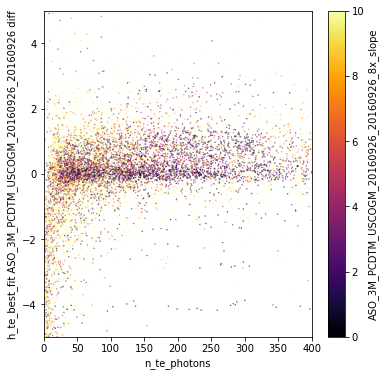

In [208]:
f, ax = plt.subplots(figsize=(6,6))
col1 = 'n_te_photons'
col2 = atl08_diff_col
ax = atl08_crop.plot(ax=ax, kind='scatter', x=col1, y=col2, s=0.1, \
                                   c=atl08_slope_col, cmap='inferno', vmin=0, vmax=10)
ax.set_ylim(-5, 5)
ax.set_xlim(0, 400)

(0.0, 400.0)

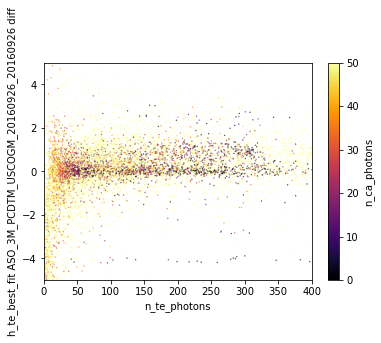

In [230]:
f, ax = plt.subplots()
col1 = 'n_te_photons'
col2 = atl08_diff_col
ax = atl08_crop.plot(ax=ax, kind='scatter', x=col1, y=col2, s=0.1, \
                                   c='n_ca_photons', cmap='inferno', vmin=0, vmax=50)
ax.set_ylim(-5, 5)
ax.set_xlim(0, 400)

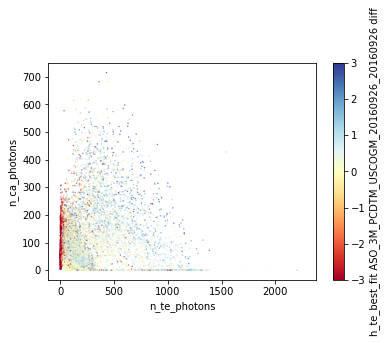

In [212]:
f, ax = plt.subplots()
col1 = 'n_te_photons'
col2 = 'n_ca_photons'
c = atl08_diff_col

ax = atl08_crop.plot(ax=ax, kind='scatter', x=col1, y=col2, s=0.1, \
                                   c=c, cmap='RdYlBu', vmin=-3, vmax=3)
#ax.set_ylim(0, 100)
#ax.set_xlim(0, 100)

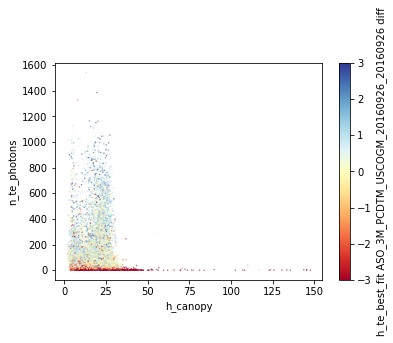

In [272]:
f, ax = plt.subplots()
col1 = 'h_canopy'
col2 = 'n_te_photons'
c = atl08_diff_col

ax = atl08_crop.plot(ax=ax, kind='scatter', x=col1, y=col2, s=0.1, \
                                   c=c, cmap='RdYlBu', vmin=-3, vmax=3)
#ax.set_ylim(0, 100)
#ax.set_xlim(0, 100)

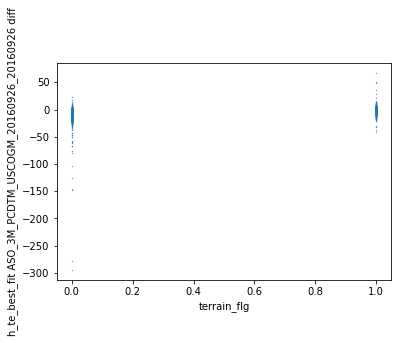

In [834]:
col1 = 'terrain_flg'
col2 = atl08_diff_col
ax = atl08_crop.plot(kind='scatter', x=col1, y=col2, s=0.1)

In [222]:
atl06sr_crop.columns

Index(['geometry', 'cycle', 'delta_time', 'dh_fit_dx', 'dh_fit_dy', 'distance',
       'gt', 'h_mean', 'h_sigma', 'n_fit_photons', 'pflags', 'rgt',
       'rms_misfit', 'segment_id', 'spot', 'w_surface_window_final', 'acqdate',
       'x', 'y', 'doy', 'decyear', 'dowy',
       'ASO_3M_PCDTM_USCOGM_20160926_20160926',
       'h_mean ASO_3M_PCDTM_USCOGM_20160926_20160926 diff',
       'ASO_3M_PCDTM_USCOGM_20160926_20160926_8x_slope',
       'ASO_3M_PCDTM_USCOGM_20160926_20160926_8x_tri',
       'ASO_3M_PCDTM_USCOGM_20160926_20160926_8x_roughness'],
      dtype='object')

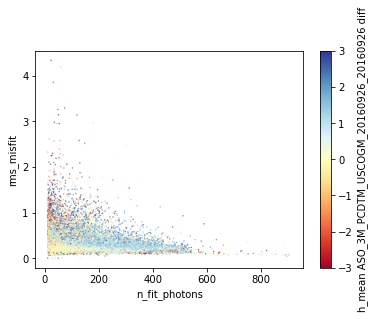

In [225]:
f, ax = plt.subplots()
col1 = 'n_fit_photons'
col2 = 'rms_misfit'
c = atl06sr_diff_col

ax = atl06sr_crop.plot(ax=ax, kind='scatter', x=col1, y=col2, s=0.1, \
                                   c=c, cmap='RdYlBu', vmin=-3, vmax=3)
#ax.set_ylim(0, 100)
#ax.set_xlim(0, 100)

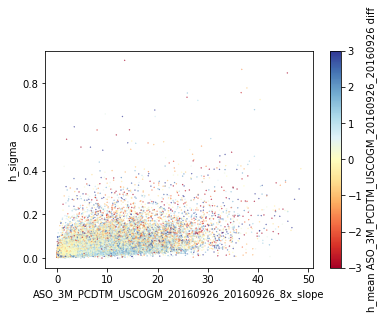

In [227]:
f, ax = plt.subplots()
col1 = 'ASO_3M_PCDTM_USCOGM_20160926_20160926_8x_slope'
col2 = 'h_sigma'
c = atl06sr_diff_col

ax = atl06sr_crop.plot(ax=ax, kind='scatter', x=col1, y=col2, s=0.1, \
                                   c=c, cmap='RdYlBu', vmin=-3, vmax=3)
#ax.set_ylim(0, 100)
#ax.set_xlim(0, 100)

## Use SNOTEL observations to define snow-free days

In [363]:
snotel_depth_thresh = 0.1

In [364]:
clim = (-3, 3)
asc = False

# ATL06-SR Dates

In [365]:
atl06sr_dates_valid = pd.to_datetime(atl06sr_crop['acqdate'].unique(), utc=True)
#gedi_dates_valid = pd.to_datetime(gedi_crop[gedi_diff_col].dropna().index.date, utc=True).unique()

In [374]:
atl06sr_crop.index = atl06sr_crop.index.to_timestamp()

In [375]:
idx = (snwd_df[site_codes].loc[atl06sr_dates_valid] < snotel_depth_thresh).any(axis=1)
idx = idx[idx]
atl06sr_crop_snowfree_idx = atl06sr_crop.index.normalize().isin(idx.index.date)

In [376]:
atl06sr_crop[atl06sr_crop_snowfree_idx]['acqdate'].value_counts()

2018-11-20    6998
2019-07-11    6466
2020-05-18    5236
2020-10-07    4826
2020-07-19    4345
2019-11-08    3684
2020-04-19    3663
2019-08-09    3399
2021-04-17    1092
2019-04-11    1059
2019-08-19     908
2019-05-10     801
2020-07-08     748
2020-05-07     619
2019-07-21     558
2021-07-06     350
2018-11-09     307
2021-05-16     249
2020-08-06     149
2020-10-18      41
2019-04-22      32
2021-05-06       7
Name: acqdate, dtype: int64

In [380]:
atl06sr_crop[atl06sr_crop_snowfree_idx]['diff_plus'].describe()

count    45537.000000
mean        -0.074160
std          1.584775
min        -50.713634
25%         -0.630769
50%          0.079998
75%          0.574001
max         16.961377
Name: diff_plus, dtype: float64

count    13904.000000
mean         0.074817
std          0.947014
min        -22.678756
25%         -0.156125
50%          0.050352
75%          0.322857
max          7.351457
Name: h_mean ASO_3M_PCDTM_USCOGM_20160926_20160926 diff, dtype: float64
count    24345.000000
mean         0.603919
std          1.753100
min        -47.598429
25%          0.108287
50%          0.631037
75%          1.168448
max         74.854247
Name: h_mean ASO_3M_PCDTM_USCOGM_20160926_20160926 diff, dtype: float64


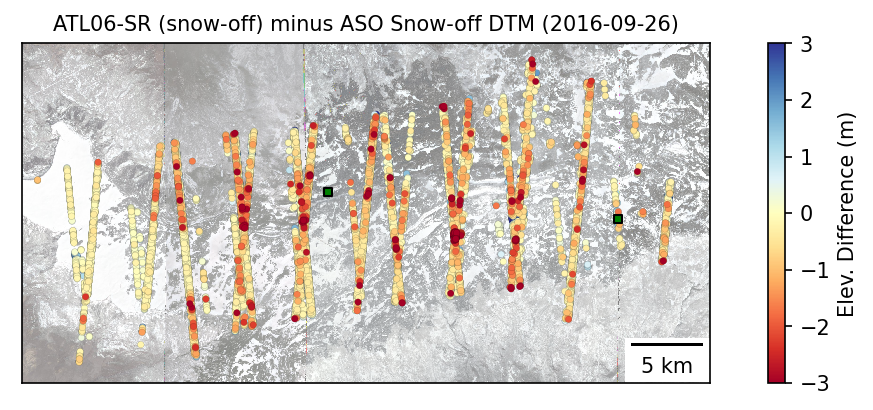

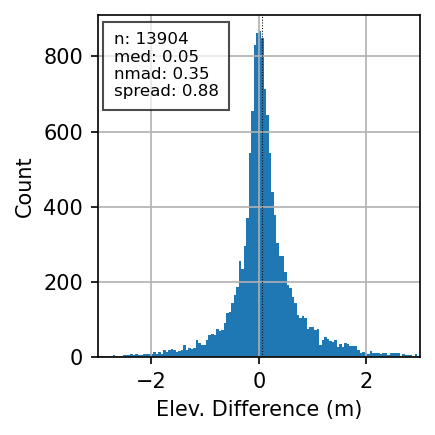

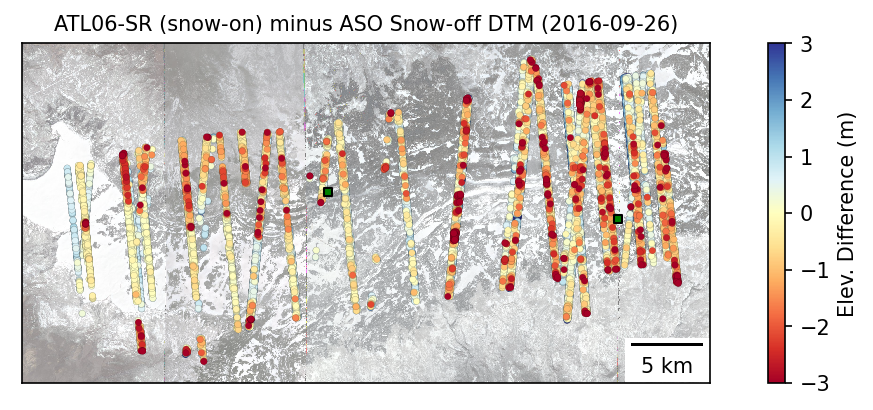

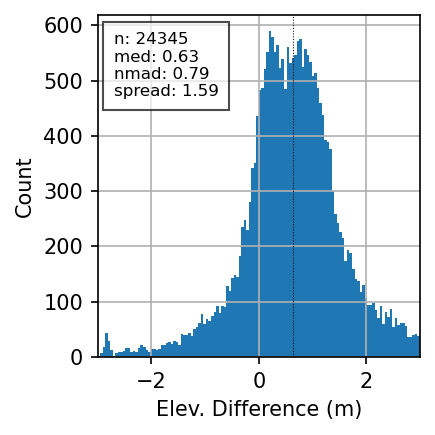

In [254]:
xover_plot2(atl06sr_crop[atl06sr_crop_snowfree_idx], atl06sr_diff_col, asc=asc, clim=clim, title='ATL06-SR (snow-off) minus ASO Snow-off DTM (2016-09-26)')
print(atl06sr_crop[atl06sr_crop_snowfree_idx][atl06sr_diff_col].describe())
xover_plot2(atl06sr_crop[~atl06sr_crop_snowfree_idx], atl06sr_diff_col, asc=asc, clim=clim, title='ATL06-SR (snow-on) minus ASO Snow-off DTM (2016-09-26)')
print(atl06sr_crop[~atl06sr_crop_snowfree_idx][atl06sr_diff_col].describe())

## Clip to radius around SNOTEL locaitons

In [290]:
r = 10000 #m

<AxesSubplot:>

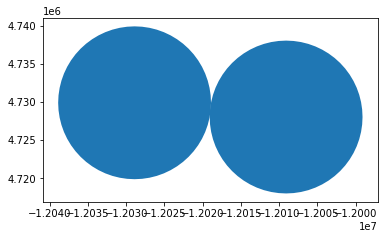

In [291]:
snotel_site_gdf.buffer(r).plot()

## Time series, aggregated by acqdate

In [141]:
dt_min_plot = '2018-09-01'
dt_max_plot = '2021-09-01'

(-20.0, 20.0)

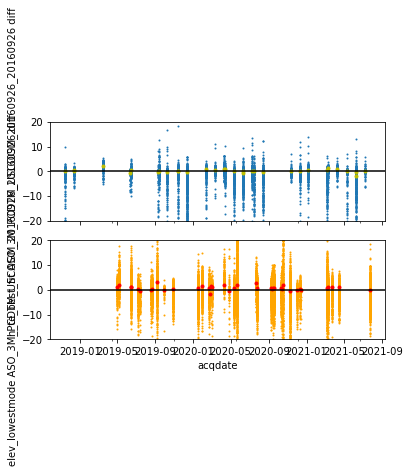

In [256]:
f, axa = plt.subplots(2,1, sharex=True, sharey=True)
pd.DataFrame(atl08_crop.drop(columns='geometry')).plot(ax=axa[0], x='acqdate', y=atl08_diff_col, kind='scatter', s=1)
pd.DataFrame(atl08_crop.drop(columns='geometry')).groupby('acqdate').median()[atl08_diff_col].plot(ax=axa[0], marker='o', markersize=3, lw=0, color='y')
pd.DataFrame(gedi_crop.drop(columns='geometry')).plot(ax=axa[1], x='acqdate', y=gedi_diff_col, kind='scatter', color='orange', s=1)
pd.DataFrame(gedi_crop.drop(columns='geometry')).groupby('acqdate').median()[gedi_diff_col].plot(ax=axa[1], marker='o', markersize=3, lw=0, color='r')
axa[0].axhline(0, color='k')
axa[1].axhline(0, color='k')
axa[0].set_ylim(-20, 20)

In [149]:
def altimetry_ts_plot(df, col, title):
    #f, ax = plt.subplots(figsize=(4,3), dpi=150)
    f, ax = plt.subplots(figsize=(6,4), dpi=150)
    pd.DataFrame(df.drop(columns='geometry')).plot(ax=ax, x='acqdate', y=col, kind='scatter', s=1, color='r', alpha=0.01)
    #mad = pd.DataFrame(df.drop(columns='geometry')).groupby('acqdate').mad()[col]
    label = None
    if 'ATL08' in title:
        label = 'ATL08'
    elif 'GEDI' in title:
        label = 'GEDI'
    elif 'ATL06-SR' in title:
        label = 'ATL06-SR'
    label = ''
    df_med = pd.DataFrame(df.drop(columns='geometry')).groupby('acqdate').median()[col]
    df_med.plot(ax=ax, marker='o', markersize=4, markeredgecolor='k', markeredgewidth=0.5, lw=0, color='r', label=label)
    ax.autoscale(False)
    #snotel_df.plot(ax=ax, color='gray', lw=0.5, label='SNOTEL')
    snotel_df.plot(ax=ax, color='gray', lw=0.5, style=['--','-'])
    ax.axhline(0, color='k', lw=0.5)
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    #ax.xaxis.set_minor_locator(AutoMinorLocator())
    #ax.tick_params(which='minor')
    ax.set_ylim(-8, 8)
    ax.set_ylabel('Elevation difference (m)')
    ax.set_xlim(dt_min_plot, dt_max_plot)
    ax.set_title(title)
    ax.format_xdata = mdates.DateFormatter('%Y-%m-%d')
    f.autofmt_xdate()
    #ax.legend(loc='upper right', fontsize=6)
    ax.legend(loc='upper right')
    ax.grid(axis='y', which='major', alpha=0.5)
    #plt.tight_layout()

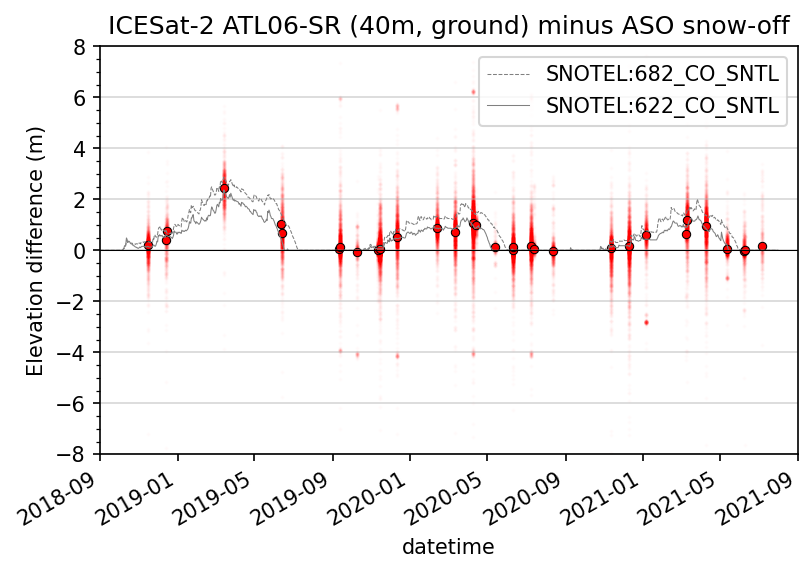

In [901]:
altimetry_ts_plot(atl06sr_crop, atl06sr_diff_col, title='ICESat-2 ATL06-SR (40m, ground) minus ASO snow-off')

# Filter outliers

In [378]:
#from scipy.stats import zscore

In [383]:
zscore_thresh = 3
absdiff_thresh = 5.0

## Stats aggregation

In [ ]:
df = atl06sr_crop
col = atl06sr_diff_col

In [ ]:
snotel_df.index = pd.to_datetime(snotel_df.index.date)
snotel_df['SNOTEL_mean'] = snotel_df.mean(axis=1)

In [461]:
snotel_df

,SNOTEL:682_CO_SNTL,SNOTEL:622_CO_SNTL,SNOTEL_mean
2016-06-01,0.9398,0.3810,0.6604
2016-06-02,0.8890,0.3048,0.5969
2016-06-03,0.8128,0.2286,0.5207
2016-06-04,0.7620,0.1270,0.4445
2016-06-05,0.6604,0.0762,0.3683
...,...,...,...
2021-07-28,0.0000,0.0000,0.0000
2021-07-29,0.0000,0.0000,0.0000
2021-07-30,0.0000,0.0000,0.0000
2021-07-31,0.0000,0.0000,0.0000


In [131]:
def stats_agg(df, col, snotel_col='SNOTEL_mean', title=None):
    stats = df.groupby('acqdate')[col].aggregate(['median', nmad, p16, p84, 'count']).dropna()
    stats.index = pd.to_datetime(stats.index)

    stats_snotel_join = stats.join(snotel_df)
    add_dowy(stats_snotel_join)

    stat_col = 'median'
    out_col = f'{stat_col} - {snotel_col}'
    stats_snotel_join[out_col] = stats_snotel_join[stat_col] - stats_snotel_join[snotel_col]

    #(stats_snotel_join.iloc[:,-3:]**2).mean()**.5
    #stats_snotel_join.iloc[:,-3:].describe()
    #stats_snotel_join.iloc[:,-3:].plot(kind='bar')
    
    SS_tot = ((stats_snotel_join[stat_col] - stats_snotel_join[stat_col].mean())**2).sum()
    SS_res = (stats_snotel_join[out_col]**2).sum()
    R2 = 1 - (SS_res/SS_tot)

    RMSE = (stats_snotel_join[out_col]**2).mean()**.5
    bias = stats_snotel_join[out_col].mean()

    f, ax = plt.subplots()
    stats_snotel_join.plot(ax=ax, kind='scatter', x=snotel_col, y='median', c='dowy', cmap='twilight')
    ax.plot(np.arange(0,4), np.arange(0,4), color='r', lw=0.5)
    ax.set_aspect('equal')
    if title is None:
        title = f'{col}\n daily median vs. daily SNOTEL SD' 
    ax.set_title(title)
    ax.set_ylabel(f'Daily aggregated {stat_col} SD (m)')
    ax.set_xlabel(f'{snotel_col} daily SD (m)')
    df_str = f'n: {stats_snotel_join.shape[0]}\nbias: {bias:+0.2f}\nRMSE: {RMSE:0.2f}\n$R^2$: {R2:0.2f}'
    ax.text(0.05, 0.95, df_str, va='top', color='k', transform=ax.transAxes, fontsize=10, \
                bbox={'facecolor': 'w', 'alpha': 0.5, 'pad': 5})
    
    #return stats_snotel_join

In [132]:
stats_agg(atl06sr_crop, atl06sr_diff_col, title='Snow depth: ATL06-SR vs. SNOTEL')

/Users/Hannah/opt/miniconda3/envs/datum_reproj2/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1374: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(


TypeError: Cannot join tz-naive with tz-aware DatetimeIndex

/nobackupp16/swbuild/deshean/miniconda3/envs/shean_py3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1374: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(


Adding Day of Water Year (DOWY)


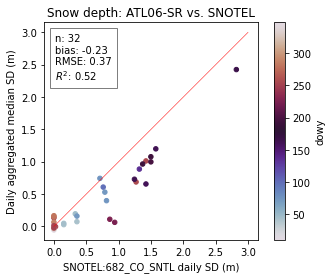

In [474]:
stats_agg(atl06sr_crop, atl06sr_diff_col, 'SNOTEL:682_CO_SNTL', title='Snow depth: ATL06-SR vs. SNOTEL')

/nobackupp16/swbuild/deshean/miniconda3/envs/shean_py3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1374: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(


Adding Day of Water Year (DOWY)


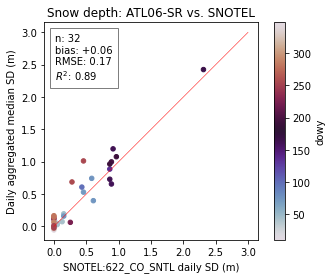

In [475]:
stats_agg(atl06sr_crop, atl06sr_diff_col, 'SNOTEL:622_CO_SNTL', title='Snow depth: ATL06-SR vs. SNOTEL')

# Old

In [786]:
df2 = pd.DataFrame(atl08_crop.drop(columns='geometry')).groupby('acqdate')[atl08_diff_col].aggregate(['median', nmad, p16, p84, 'count']).dropna()

/nobackupp16/swbuild/deshean/miniconda3/envs/shean_py3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1374: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(


In [750]:
#df2 = pd.DataFrame(atl08_crop.drop(columns='geometry')).groupby('acqdate')[[atl08_diff_col, atl08_slope_col]].aggregate(['mean', 'std', 'median', nmad, p16, p84, 'count']).dropna()

In [787]:
df2 = pd.DataFrame(gedi_crop.drop(columns='geometry')).groupby('acqdate')[gedi_diff_col].aggregate(['median', nmad, p16, p84, 'count']).dropna()

/nobackupp16/swbuild/deshean/miniconda3/envs/shean_py3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1374: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(


In [756]:
df2['spread'] = df2['p84'] - df2['p16']

In [757]:
df2

,median,nmad,p16,p84,count,spread
acqdate,,,,,,
2019-05-01,1.382080,1.542507,-0.744121,2.610078,278,3.354199
2019-05-08,1.766846,0.623663,1.157559,2.487148,1225,1.329590
2019-06-13,1.153076,2.348419,-1.949922,2.230186,3,4.180107
2019-06-16,1.209351,1.237734,-0.148350,2.512646,1618,2.660996
2019-07-08,0.324341,0.811884,-0.628037,1.232354,1028,1.860391
2019-07-12,-0.567871,0.813694,-2.865371,0.152383,23,3.017754
2019-08-18,0.030640,0.403408,-0.391846,0.641016,1536,1.032861
2019-08-21,0.217041,0.409743,-0.090029,1.208047,1247,1.298076
2019-09-05,2.865234,1.253660,1.044189,4.009443,902,2.965254


<AxesSubplot:xlabel='count', ylabel='spread'>

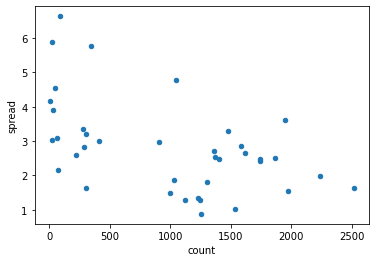

In [758]:
df2.plot.scatter(x='count', y='spread')

In [759]:
errors = pd.DataFrame([df2['median'] - df2['p16'], df2['p84'] - df2['median']]).abs()
errors

acqdate,2019-05-01,2019-05-08,2019-06-13,2019-06-16,2019-07-08,2019-07-12,2019-08-18,2019-08-21,2019-09-05,2019-09-28,...,2020-10-13,2020-10-16,2020-11-09,2020-12-02,2020-12-10,2021-03-07,2021-03-11,2021-03-23,2021-04-16,2021-07-24
0,2.126201,0.609287,3.102998,1.357700,0.952378,2.297500,0.422485,0.307070,1.821045,1.096553,...,1.713379,3.826743,1.855674,0.887036,1.369263,2.722080,1.15606,0.435010,1.510503,1.442285
1,1.227998,0.720303,1.077109,1.303296,0.908013,0.720254,0.610376,0.991006,1.144209,1.071553,...,1.585293,2.806440,1.771143,0.753784,1.452173,2.042402,0.81728,0.860029,1.026812,1.037500


<ErrorbarContainer object of 3 artists>

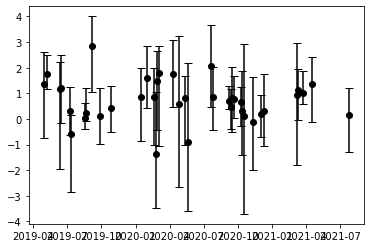

In [760]:
f, ax = plt.subplots()
ax.errorbar(df2.index, y=df2['median'], yerr=errors, fmt='ok', capsize=4)

<AxesSubplot:xlabel='acqdate'>

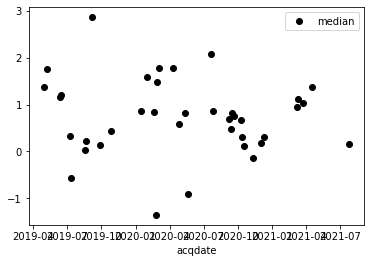

In [761]:
df2.plot(y='median', yerr=df2[['p16', 'p84']], fmt='ok', capsize=3)

<AxesSubplot:xlabel='acqdate'>

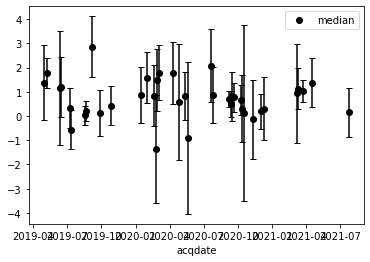

In [762]:
df2.plot(y='median', yerr='nmad', fmt='ok', capsize=3)

In [ ]:
snotel_df.loc[atl08_dates_valid]

## Boxplot

<AxesSubplot:title={'center':'h_te_best_fit ASO_3M_PCDTM_USCOGM_20160926_20160926 diff'}, xlabel='acqdate'>

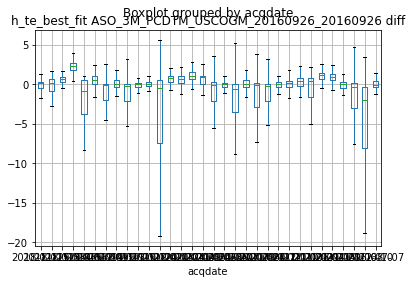

In [886]:
atl08_crop[[atl08_diff_col, 'acqdate']].dropna().boxplot(column=atl08_diff_col, by='acqdate', showfliers=False)

In [433]:
pd.to_datetime(atl08_crop.index.date)

DatetimeIndex(['2018-11-14', '2018-11-14', '2018-11-14', '2018-11-14',
               '2018-11-14', '2018-11-14', '2018-11-14', '2018-11-14',
               '2018-11-14', '2018-11-14',
               ...
               '2021-07-07', '2021-07-07', '2021-07-07', '2021-07-07',
               '2021-07-07', '2021-07-07', '2021-07-07', '2021-07-07',
               '2021-07-07', '2021-07-07'],
              dtype='datetime64[ns]', length=22068, freq=None)

In [432]:
#atl08_crop['acqdate'] = pd.to_datetime(atl08_crop.index.date)

/nobackupp16/swbuild/deshean/miniconda3/envs/shean_py3/lib/python3.9/site-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [435]:
snotel_df.index.rename('acqdate', inplace=True)

In [633]:
atl08_crop.groupby('acqdate').median().index

Index([2018-10-17, 2018-11-14, 2018-11-15, 2018-12-13, 2018-12-14, 2019-01-11,
       2019-02-13, 2019-03-14, 2019-03-15, 2019-04-12, 2019-05-15, 2019-05-16,
       2019-06-12, 2019-06-14, 2019-07-17, 2019-09-11, 2019-09-13, 2019-10-10,
       2019-11-12, 2019-11-14, 2019-12-11, 2020-01-09, 2020-01-15, 2020-02-12,
       2020-03-11, 2020-03-12, 2020-04-09, 2020-04-14, 2020-05-12, 2020-05-13,
       2020-06-10, 2020-06-11, 2020-07-09, 2020-07-14, 2020-08-11, 2020-08-12,
       2020-10-08, 2020-11-09, 2020-11-11, 2020-12-10, 2021-01-06, 2021-03-09,
       2021-03-11, 2021-04-07, 2021-04-09, 2021-05-12, 2021-06-08, 2021-06-10,
       2021-07-07, 2021-07-12],
      dtype='object', name='acqdate')

In [644]:
xpos = atl08_crop.groupby('acqdate').median().index.array
xpos

<PandasArray>
[datetime.date(2018, 10, 17), datetime.date(2018, 11, 14),
 datetime.date(2018, 11, 15), datetime.date(2018, 12, 13),
 datetime.date(2018, 12, 14),  datetime.date(2019, 1, 11),
  datetime.date(2019, 2, 13),  datetime.date(2019, 3, 14),
  datetime.date(2019, 3, 15),  datetime.date(2019, 4, 12),
  datetime.date(2019, 5, 15),  datetime.date(2019, 5, 16),
  datetime.date(2019, 6, 12),  datetime.date(2019, 6, 14),
  datetime.date(2019, 7, 17),  datetime.date(2019, 9, 11),
  datetime.date(2019, 9, 13), datetime.date(2019, 10, 10),
 datetime.date(2019, 11, 12), datetime.date(2019, 11, 14),
 datetime.date(2019, 12, 11),   datetime.date(2020, 1, 9),
  datetime.date(2020, 1, 15),  datetime.date(2020, 2, 12),
  datetime.date(2020, 3, 11),  datetime.date(2020, 3, 12),
   datetime.date(2020, 4, 9),  datetime.date(2020, 4, 14),
  datetime.date(2020, 5, 12),  datetime.date(2020, 5, 13),
  datetime.date(2020, 6, 10),  datetime.date(2020, 6, 11),
   datetime.date(2020, 7, 9),  datetime.da

In [882]:
import seaborn as sns

In [ ]:
#bp_dict = atl08_crop.boxplot(column=atl08_diff_col, by='acqdate', showfliers=False, rot=90, grid=False)

In [879]:
atl08_acqdate_unique = np.sort(atl08_crop['acqdate'].unique().astype("datetime64[D]"))
gedi_acqdate_unique = np.sort(gedi_crop['acqdate'].unique().astype("datetime64[D]"))
atl06sr_acqdate_unique = np.sort(atl06sr_crop['acqdate'].unique().astype("datetime64[D]"))

In [880]:
atl08_acqdate_unique

array(['2018-10-17', '2018-11-14', '2018-11-15', '2018-12-13',
       '2018-12-14', '2019-01-11', '2019-02-13', '2019-03-14',
       '2019-03-15', '2019-04-12', '2019-05-15', '2019-05-16',
       '2019-06-12', '2019-06-14', '2019-07-17', '2019-09-11',
       '2019-09-13', '2019-10-10', '2019-11-12', '2019-11-14',
       '2019-12-11', '2020-01-09', '2020-01-15', '2020-02-12',
       '2020-03-11', '2020-03-12', '2020-04-09', '2020-04-14',
       '2020-05-12', '2020-05-13', '2020-06-10', '2020-06-11',
       '2020-07-09', '2020-07-14', '2020-08-11', '2020-08-12',
       '2020-10-08', '2020-11-09', '2020-11-11', '2020-12-10',
       '2021-01-06', '2021-03-09', '2021-03-11', '2021-04-07',
       '2021-04-09', '2021-05-12', '2021-06-08', '2021-06-10',
       '2021-07-07', '2021-07-12'], dtype='datetime64[D]')

In [ ]:
sns.boxplot(x='acqdate', y=atl08_diff_col, data=atl08_crop, order=atl08_acqdate_unique)

In [ ]:
snotel_df.boxplot(ax=ax, column='SNOTEL:682_CO_SNTL', by='acqdate', showfliers=False, rot=90, grid=False)

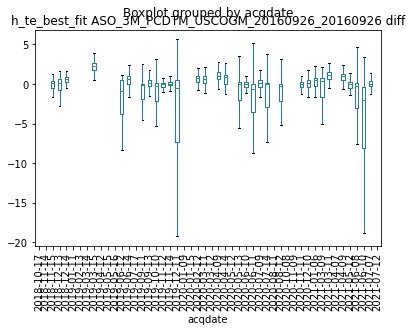

In [860]:
f, ax = plt.subplots()
#snotel_df.plot(ax=ax, color='gray', lw=0.5, label='SNOTEL')
#snotel_df.boxplot(ax=ax, column='SNOTEL:682_CO_SNTL', by='acqdate', showfliers=False, rot=90, grid=False)
bp_dict = atl08_crop.boxplot(ax=ax, column=atl08_diff_col, by='acqdate', showfliers=False, rot=90, grid=False)
#ax.plot(bp_dict)

In [ ]:
f, ax = plt.subplots()
#snotel_df.plot(ax=ax, color='gray', lw=0.5, label='SNOTEL')
atl08_crop.boxplot(ax=ax, column=atl08_diff_col, by='acqdate', showfliers=False, rot=90, grid=False, positions=pos)

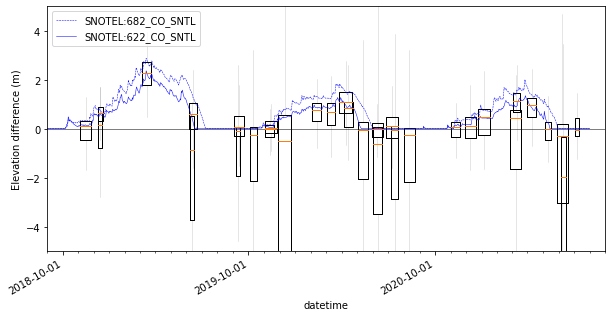

In [267]:
boxplot_date(atl08_crop, atl08_diff_col)

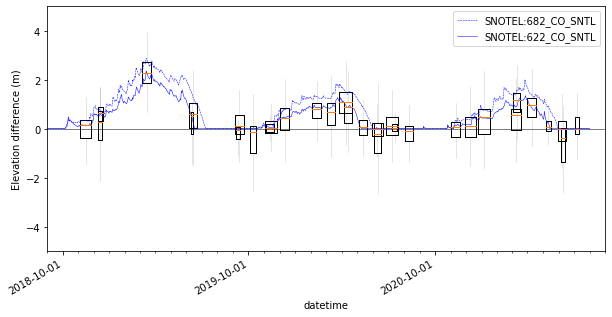

In [266]:
boxplot_date(atl08_crop[atl08_nphoton_idx], atl08_diff_col)

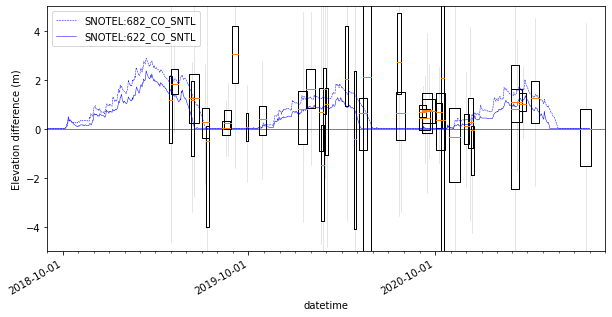

In [268]:
boxplot_date(gedi_crop, gedi_diff_col)

In [316]:
cl_fn = '/nobackup/deshean/gm_classification/27nov2010_tree_map_final_fix_4x.tif'

In [317]:
cl_src = rio.open(cl_fn)

In [318]:
col = sample_raster(atl08_crop, cl_src)

/nobackupp16/swbuild/deshean/miniconda3/envs/shean_py3/lib/python3.9/site-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [319]:
idx = atl08_crop[col] == 1

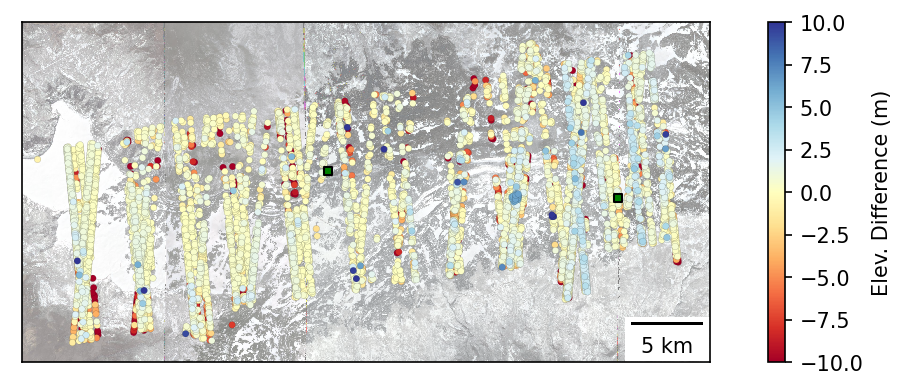

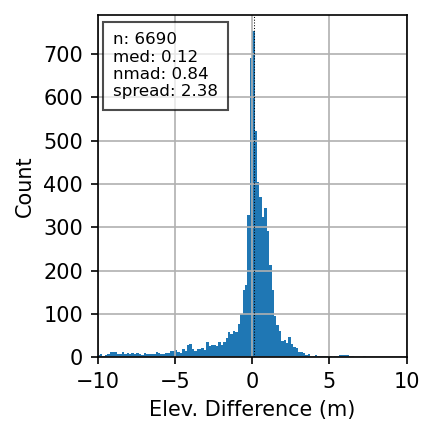

In [320]:
xover_plot2(atl08_crop[~idx], atl08_diff_col)

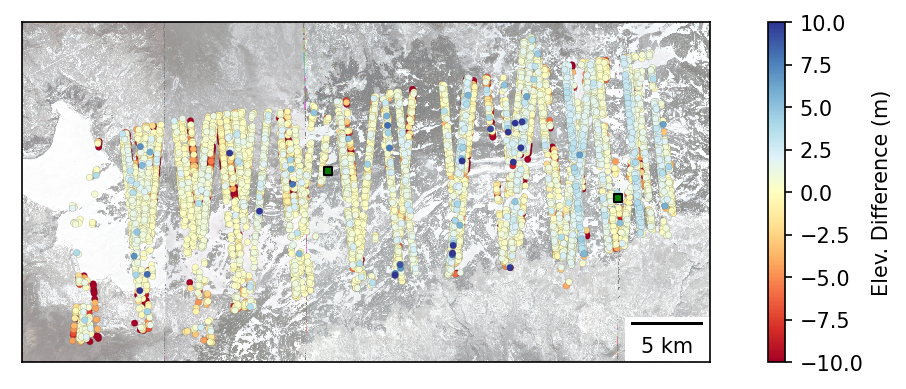

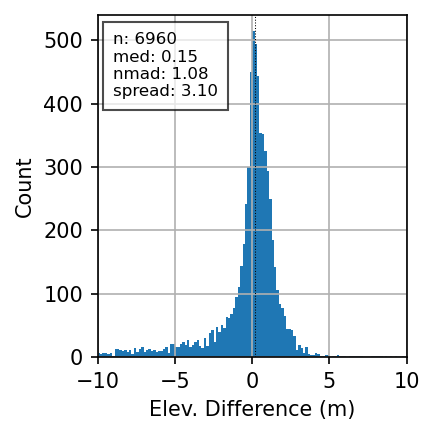

In [321]:
xover_plot2(atl08_crop[idx], atl08_diff_col)

In [322]:
cl_fn = './GM_combine_3trees_3aso_matrix.tif'

In [323]:
cl_src = rio.open(cl_fn)

In [194]:
gdaldem_fn = os.path.splitext(dem_fn)[0]+f'_slope.tif'
gdaldem_src = rio.open(gdaldem_fn)
gdaldem = gdaldem_src.read(1, masked=True)

In [ ]:
f, ax = plt.subplots(figsize=(6,3))
m = ax.imshow(gdaldem, vmin=0, vmax=40)
f.colorbar(m)

In [359]:
slope = rioxarray.open_rasterio(gdaldem_fn, masked=True).squeeze()
clmatrix = rioxarray.open_rasterio(cl_fn, masked=True).squeeze()

In [360]:
clmatrix

<xarray.DataArray (y: 6500, x: 12450)>
[80925000 values with dtype=float32]
Coordinates:
    band         int64 1
  * x            (x) float64 2.183e+05 2.183e+05 ... 2.557e+05 2.557e+05
  * y            (y) float64 4.336e+06 4.336e+06 ... 4.317e+06 4.317e+06
    spatial_ref  int64 0
Attributes:
    LAYER_TYPE:              athematic
    STATISTICS_MAXIMUM:      9
    STATISTICS_MEAN:         7.2166037518148
    STATISTICS_MEDIAN:       0
    STATISTICS_MINIMUM:      1
    STATISTICS_MODE:         0
    STATISTICS_SKIPFACTORX:  1
    STATISTICS_SKIPFACTORY:  1
    STATISTICS_STDDEV:       2.3092850623765
    scale_factor:            1.0
    add_offset:              0.0
    long_name:               Layer_1

In [350]:
#ds.rename({'band':'slope'})

In [324]:
col = sample_raster(atl08_crop, cl_src)

/nobackupp16/swbuild/deshean/miniconda3/envs/shean_py3/lib/python3.9/site-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [331]:
treeless = [1,2,3]
sparse = [4,5,6]
dense = [7,8,9]

In [337]:
atl08_crop[col].value_counts()

9.0    5002
8.0    1940
6.0    1414
7.0     615
5.0     419
4.0     372
2.0     320
3.0     312
1.0     295
Name: GM_combine_3trees_3aso_matrix, dtype: int64

In [332]:
idx = atl08_crop[col].isin(treeless)

In [333]:
idx.value_counts()

False    48064
True       927
Name: GM_combine_3trees_3aso_matrix, dtype: int64

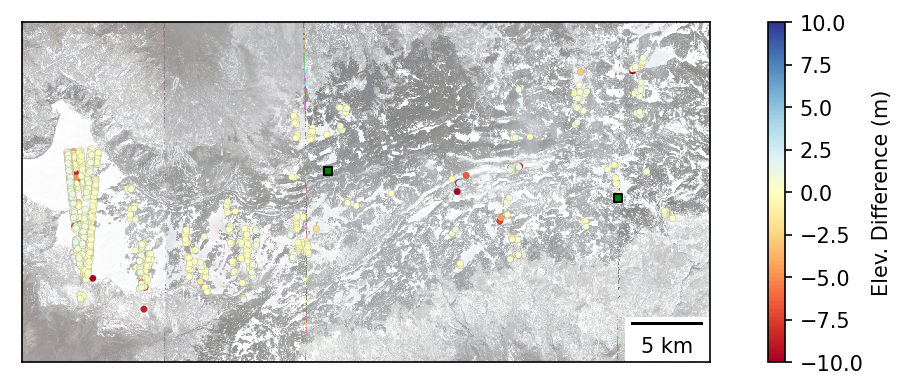

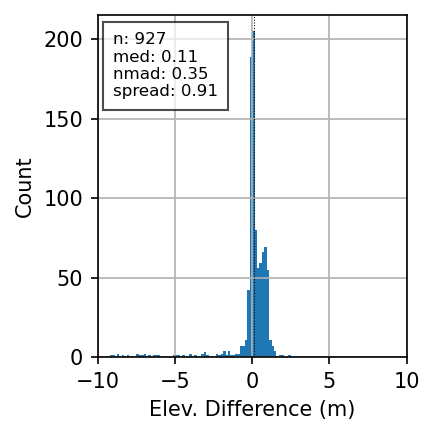

In [334]:
xover_plot2(atl08_crop[idx], atl08_diff_col)

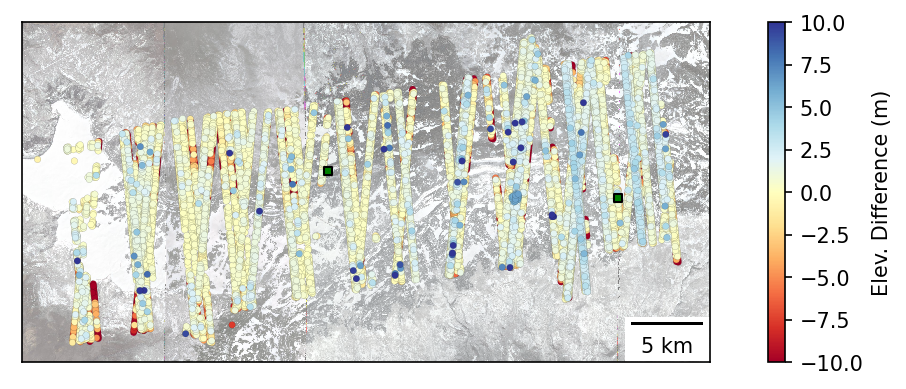

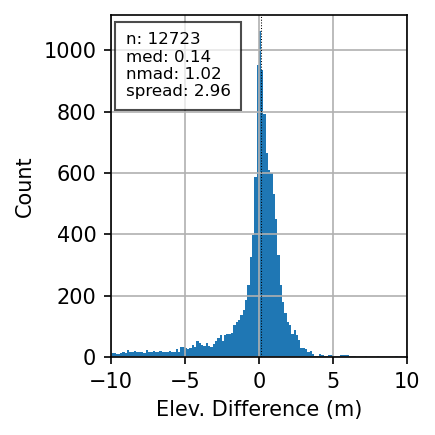

In [335]:
xover_plot2(atl08_crop[~idx], atl08_diff_col)

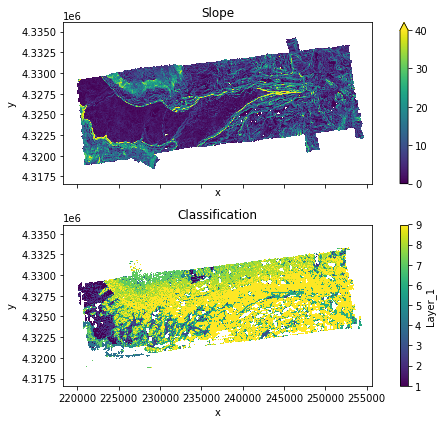

In [364]:
f, axa = plt.subplots(2, 1, figsize=(8,6), sharex=True, sharey=True)
slope.plot.imshow(ax=axa[0], vmin=0, vmax=40)
axa[0].axes.set_aspect('equal')
axa[0].set_title('Slope')
clmatrix.plot.imshow(ax=axa[1], vmin=1, vmax=9)
axa[1].axes.set_aspect('equal')
axa[1].set_title('Classification')
plt.tight_layout()

In [368]:
clmatrix_cp = clmatrix.copy()

In [372]:
clmatrix_cp

<xarray.DataArray (y: 6500, x: 12450)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
    band         int64 1
  * x            (x) float64 2.183e+05 2.183e+05 ... 2.557e+05 2.557e+05
  * y            (y) float64 4.336e+06 4.336e+06 ... 4.317e+06 4.317e+06
    spatial_ref  int64 0
Attributes:
    LAYER_TYPE:              athematic
    STATISTICS_MAXIMUM:      9
    STATISTICS_MEAN:         7.2166037518148
    STATISTICS_MEDIAN:       0
    STATISTICS_MINIMUM:      1
    STATISTICS_MODE:         0
    STATISTICS_SKIPFACTORX:  1
    STATISTICS_SKIPFACTORY:  1
    STATISTICS_STDDEV:       2.3092850623765
    scale_factor:            1.0
    add_offset:              0.0
    long_name:               Layer_1

In [370]:
clmatrix.isin(treeless)

<xarray.DataArray (y: 6500, x: 12450)>
array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])
Coordinates:
    band         int64 1
  * x            (x) float64 2.183e+05 2.183e+05 ... 2.557e+05 2.557e+05
  * y            (y) float64 4.336e+06 4.336e+06 ... 4.317e+06 4.317e+06
    spatial_ref  int64 0

In [375]:
clmatrix_cp.sel[clmatrix.isin(treeless)]

TypeError: 'method' object is not subscriptable

In [381]:
clmatrix_cp.where(clmatrix.isin(treeless))

<xarray.DataArray (y: 6500, x: 12450)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
    band         int64 1
  * x            (x) float64 2.183e+05 2.183e+05 ... 2.557e+05 2.557e+05
  * y            (y) float64 4.336e+06 4.336e+06 ... 4.317e+06 4.317e+06
    spatial_ref  int64 0
Attributes:
    LAYER_TYPE:              athematic
    STATISTICS_MAXIMUM:      9
    STATISTICS_MEAN:         7.2166037518148
    STATISTICS_MEDIAN:       0
    STATISTICS_MINIMUM:      1
    STATISTICS_MODE:         0
    STATISTICS_SKIPFACTORX:  1
    STATISTICS_SKIPFACTORY:  1
    STATISTICS_STDDEV:       2.3092850623765
    scale_factor:            1.0
    add_offset:              0.0
    long_name:               Layer_1